In [1]:
Full={}
Full_f={}
Full_f1={}
max_kin=2

In [323]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import pandas as pd
import matplotlib.pyplot as plt
import os,sys
import glob
import numpy as np
import scipy
from scipy import interpolate

from scipy.interpolate import make_interp_spline, BSpline

sys.path.append('/home/jbane/headers')
import SQLFuncs as SQLF
import seaborn as sns


plt.style.use('seaborn-white')

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 12


def Cross_table(tgt,table):
   
    #Fill the table once
    if len(table) != 10:
        for i in range(16):
            file_name = "/home/jbane/tritium/T2_externals/OUT/marathon_kin{}_{}.out".format(i,tgt)
            #file_name = "/home/jbane/tritium/extern/T2_externals/OUT/marathon_kin{}_{}.out".format(i,tgt)
           # print(file_name)
            if os.path.isfile(file_name):
                table[i] = pd.read_table(file_name,delim_whitespace=True)
                
                
def interper(DFs,x,Q):
    f = interpolate.interp2d(DFs["x"],DFs["Q2"],DFs["Sig_Born"],kind='linear', copy=True,  bounds_error=True)
    sigma_born=f(x,Q)
    h = interpolate.interp2d(DFs["x"],DFs["Q2"],DFs["Sig_Rad"],kind='linear', copy=True, bounds_error=True )
    sigma_rad=h(x,Q)
    return sigma_born,sigma_rad  

def weighted_average(df,data_col,weight_col,by_col):
    df['_data_times_weight'] = df[data_col]*df[weight_col]
    df['_weight_where_notnull'] = df[weight_col]*pd.notnull(df[data_col])
    g = df.groupby(by_col)
    result = g['_data_times_weight'].sum() / g['_weight_where_notnull'].sum()
    del df['_data_times_weight'], df['_weight_where_notnull']
    return result

def wavg(group, avg_name, weight_name):
    """ http://stackoverflow.com/questions/10951341/pandas-dataframe-aggregate-function-using-multiple-columns
    In rare instance, we may not have weights, so just return the mean. Customize this if your business case
    should return otherwise.
    """
    d = group[avg_name]
    w = group[weight_name]
    try:
        return (d * w).sum() / w.sum()
    except ZeroDivisionError:
        return d.mean()



In [645]:
cuttype="tightcut/"

def all_tgt(tgt,bins):

    table={}
    Cross_table(tgt,table)
    
    Xaxis="Xbj" #theta / Xbj
    if Xaxis == "Xbj":
        xaxis="xbj"
    else :
        xaxis="theta"

   
        
    mcfile='/home/jbane/tritium/Tri_offline/MC_comparison/yield_output/{}{}bins/{}/'.format(cuttype,bins,xaxis)
    datafile='/home/jbane/tritium/Tri_offline/yield/yield_output/{}{}bins/{}/'.format(cuttype,bins,xaxis)
    kins={}
    kin={}
    sig_r={}
    sig_b={}
    sig_rr={}
    sig_bb={}

    kins=sorted(glob.glob('{}{}_kin?.dat'.format(mcfile,tgt)))
    kins+=sorted(glob.glob('{}{}_kin??.dat'.format(mcfile,tgt)))

    kin_num_array={}

    mcDF={}
    dataDF={}
    mcDFs={}
    dataDFs={}
    ratios={}
    i=0
    for i in range(len(kins)):
        kin[i] = kins[i].replace(mcfile,"")
        kin[i] = kin[i].replace('.dat',"")

        
        kin_str_num=kin[i].replace("{}_kin".format(tgt),"")
        kin_num=int(kin_str_num)
 
        if kin_num > max_kin :
            continue
        
        
        kin_str_num=kin[i].replace("{}_kin".format(tgt),"")
        kin_num=int(kin_str_num)   
        kin_num_array[i]=kin_num
        mcfileR=mcfile+'{}.dat'.format(kin[i])
        datafileR=datafile+'{}.dat'.format(kin[i])
        chk1=0
        chk=0
        if os.path.isfile(mcfileR):
            chk=1
        else:
            ("MC file does not exist") 
            chk=0
        if os.path.isfile(datafileR):
            chk1=1
        else :
            print("Data file does not exist")
            chk1=0
        if chk==0 or chk1==0:
            mcDF[i]=pd.DataFrame()
            dataDF[i]=pd.DataFrame()
            continue     

        mcDF[i]=pd.read_table(mcfileR,delim_whitespace=True)
        dataDF[i]=pd.read_table(datafileR,delim_whitespace=True)
        mcDF[i]['yield']=mcDF[i]['Yield']/1000.0
        mcDF[i]['Error']=mcDF[i]['Error']/1000.0

        dataDF[i]['yield']=dataDF[i]['Yield']
        mcmed=mcDF[i]['yield'].mean()
        datamed=dataDF[i]['yield'].mean()
        mcDFs[i]=mcDF[i][mcDF[i]['yield'] >=mcmed *0.5]
        dataDFs[i]=dataDF[i][dataDF[i]['yield'] >= datamed *0.5]
        mcDFs[i]=mcDFs[i].dropna()
        dataDFs[i]=dataDFs[i].dropna()
   
        if len(dataDFs[i]) <1 :
                continue
        #cut out the edge bins for now
        if bins > 24 :
            dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[0])
            
        last= len(dataDFs[i].index)
        #dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[last-1])
        if bins > 24 :
            mcDFs[i]=mcDFs[i].drop(mcDFs[i].index[0])
        ml=len(mcDFs[i].index)
        #mcDFs[i]=mcDFs[i].drop(mcDFs[i].index[ml-1])

        minind= dataDFs[i].index[0]
        maxind=dataDFs[i].index[len(dataDFs[i].index)-1]
        mcDFs[i]=mcDFs[i][mcDFs[i].index>=minind]
       # mcDFs[i]=mcDFs[i][mcDFs[i].index<=maxind]        
        if len(dataDFs[i]) >=6 :
            dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[0])
            last= len(dataDFs[i].index)
            dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[last-1])
            mcDFs[i]=mcDFs[i].drop(mcDFs[i].index[0])
            ml=len(mcDFs[i].index)
            mcDFs[i]=mcDFs[i].drop(mcDFs[i].index[ml-1])
        if len(dataDFs[i]) >=7 :
            last= len(dataDFs[i].index)
            dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[last-1])
            ml=len(mcDFs[i].index)
            mcDFs[i]=mcDFs[i].drop(mcDFs[i].index[ml-1])  
    #dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[0])
    #dataDFs[i]=dataDFs[i].drop(dataDFs[i].index[last-2])
    

       # print("data",i, dataDFs[i])
       # print("MC  ",i,mcDFs[i])
        #dataDFs[i]= dataDFs[i].drop(dataDFs[i].index[[0,len(dataDFs[i])-1]])
        #mcDFs[i]=     mcDFs[i].drop(mcDFs[i].index[  [0,  len(mcDFs[i])-1]])
        dataDFs[i]['Stat_err']=1.0/np.sqrt((dataDFs[i]['Ne']))*dataDFs[i]['yield']
        ratios[i] = mcDFs[i].copy()
        ratios[i].rename(columns={'Ne':'MC_Ne'})
        ratios[i]['Data_Ne']=dataDFs[i]['Ne']
        ratios[i]['Data_xbjc']=dataDFs[i]['Xbjc']
        #ratios[i].drop('yield')
        ratios[i]["data_err"]=dataDFs[i]['Error']
        ratios[i]["data_err_stat"]=dataDFs[i]['Stat_err']
        ratios[i]['data_Y'] =dataDFs[i]['yield']
        ratios[i]['MC_Y'] = mcDFs[i]['yield']
        ratios[i]['ratio'] = dataDFs[i]['yield']/mcDFs[i]['yield']
        ratios[i]['offset'] = dataDFs[i]['yield'] - mcDFs[i]['yield']
        ratios[i]['ratio_err'] =ratios[i]['ratio']*np.sqrt(  pow((dataDFs[i]['Stat_err']/dataDFs[i]['yield']),2) + pow((mcDFs[i]['Error']/mcDFs[i]['yield']),2))
        
        ratios[i]['new_x'] = -ratios[i]['{}'.format(Xaxis)].mean()+ratios[i]['{}'.format(Xaxis)]    
            
            #pow((1/(np.sqrt(dataDFs[i]['Ne']))),2)  +   pow((1/(np.sqrt(mcDFs[i]['Ne']))),2)     )

        i=i+1

    import matplotlib._color_data as mcd
    overlap = [name for name in mcd.CSS4_COLORS if "xkcd:" + name in mcd.XKCD_COLORS]

    markers =[[3,0,0]  ,[5,1,90] ,[4,0,90],[3,1,90],[6,2,0] ,[5,0,0] ,[4,1,0],[7,0,0]]
    markers2 =[[3,0,0] ,[5,1,90] ,[4,0,90],[3,1,90],[6,2,0] ,[5,0,0],[4,1,0],[7,0,0]]
    colors=['red', 'Green', 'Blue', 'Orange', 'Purple', 'Cyan', 'Magenta','Teal','Brown','Maroon','Mint','Navy',]
    fig= plt.figure(dpi=500,figsize=(12,7))
    ax=fig.add_subplot(2,1,1)
    plt.title('{} Data to MC comparison'.format(tgt))
    bx=fig.add_subplot(2,1,2, sharex=ax)

    #fig,bx=plt.subplots(dpi=250)
    k=int(0)

    print("start second loop")
    for j in range(len(mcDF)):
        
        xkcd = mcd.XKCD_COLORS["xkcd:" + overlap[j]].upper()
        xkcd2 = mcd.XKCD_COLORS["xkcd:" + overlap[j+len(mcDF)]].upper()
        #print(j , kin[j])
        #print()
        if k == 7:
            k = 0
        if dataDF[j].empty or mcDF[j].empty:
            continue
        if(len(dataDFs[j])) == 0:
            continue
        if(len(mcDF[j])) ==0:
            continue



        kin_str_num=kin[j].replace("{}_kin".format(tgt),"")
        kin_num=int(kin_str_num)
        print(kin_num)
        if kin_num > max_kin :
            continue
        xbj=ratios[j]["Xbjc"]
        Q2=ratios[j]["Q2"]
     #   print( xbj,Q2)
        sig_bb[kin_num],sig_rr[kin_num] =interper(table[kin_num],xbj,Q2)
        print()
        #print(sig_bb[kin_num])
        #print()
        
        if len(sig_bb[kin_num]) > 1:
            sig_b[kin_num]=sig_bb[kin_num].diagonal()
        else:
            sig_b[kin_num]=sig_bb[kin_num]
        if len(sig_rr[kin_num]) > 1:
            sig_r[kin_num]=sig_rr[kin_num].diagonal()
        else:
            sig_r[kin_num]=sig_rr[kin_num]
            
            
        ratios[j]["Sigma_Born"]=sig_b[kin_num]
        ratios[j]["Sigma_Rad"]=sig_r[kin_num]
        ratios[j]["RCF"] =ratios[j]["Sigma_Born"]/ ratios[j]["Sigma_Rad"]
        ratios[j]["Sigma_Born_C"]=ratios[j]["Sigma_Born"]*ratios[j]["ratio"]
        ratios[j]["Sigma_Rad_C"]=ratios[j]["Sigma_Rad"]*ratios[j]["ratio"]
        ratios[j]["Sig_Born_err"]=ratios[j]["Sigma_Born_C"]* np.sqrt( pow( (ratios[j]['ratio_err']/ratios[j]["ratio"] ),2) )
        ratios[j]["Sig_Rad_err"]=ratios[j]["Sigma_Rad"]  * np.sqrt( pow( (ratios[j]['ratio_err']/ratios[j]["ratio"] ),2) )




     #   print(sig_b[kin_num])
     #   print(sig_r[kin_num])    
        #if j == 110:
         #   ax = mcDFs[j].plot(x='theta',y='yield',yerr=':error',kind='scatter', marker=markers[j], color='blue', label='MC run{}'.format(runs[j]))
        #else :
        Xaxis = "Xbjc"    
        xaxis = "Xbjc" 
    
        if j == 0:
        
            mcDFs[j].plot(ax=ax,x='{}'.format(Xaxis),y='yield',yerr='Error',kind='scatter',marker=markers[k], color='blue', label='Monte Carlo')
            dataDFs[j].plot(ax=ax,x='{}'.format(Xaxis),y='yield',yerr='Stat_err',kind='scatter', marker=markers2[k], color='red', label='Data ')
            #dataDFs[j].plot(ax=ax,x='{}'.format(Xaxis),y='yield',yerr='Error',kind='scatter', marker=markers2[k], color='red')
        else :
            mcDFs[j].plot(ax=ax,x='{}'.format(Xaxis),y='yield',yerr='Error',kind='scatter',marker=markers[k], color='blue')
            dataDFs[j].plot(ax=ax,x='{}'.format(Xaxis),y='yield',yerr='Error',kind='scatter', marker=markers2[k], color='red')
            
        ratios[j].plot(ax=bx,x='{}'.format(Xaxis) ,y='ratio',yerr='ratio_err', xerr='offset', kind='scatter', label='{}'.format(kin[j]),marker=markers2[k],c=colors[k] )
        k=k+1
        print(j , kin[j])    



        
      
    ax.set_yscale("log")
    ax.grid(True)
    bx.grid(True)
    
    
    ax.legend(ncol=2)

    handles, labels = ax.get_legend_handles_labels()
    print(handles,labels)
    
    #ax.get_legend().remove()
    
    if tgt == "H":
        bx.legend(ncol=2)
    else :
        bx.legend(ncol=4)    
    #bx.set_ylim(0.7,1.2)

    
   # fig.text(0.5, 0.5, 'Preliminary',
   #      fontsize=75, color='gray',
   #      ha='center', va='center', alpha=0.5)
    
    fig.subplots_adjust(hspace=0)
    fig.savefig('images/{}{}bins/{}_all.png'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig.savefig('images/{}{}bins/{}_all.pdf'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig.savefig('images/{}{}bins/{}_all.eps'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig.savefig('/home/jbane/latex_shows/images/{}_all.pdf'.format(tgt),bbox_inches='tight')

  
    return ratios,kin,fig,dataDFs,mcDFs


In [225]:

def all_plots(Full,bins):
    D2=Full[0]
    He3=Full[1]
    H3=Full[2]

    fig3= plt.figure(dpi=400,figsize=(11,5))
    cx=fig3.add_subplot(1,1,1)
    plt.title('Coss Section by Monte Carlo Ratio')
    D2.plot(ax=cx,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',kind="scatter",label="D2")
    He3.plot(ax=cx,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',kind="scatter",color='r',marker='+',label="He3")
    H3.plot(ax=cx,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',kind="scatter",color='g',marker="x",label="H3")
    cx.set_yscale("log")
    plt.ylabel('$\sigma $ ')
    cx.grid(True)

    #fig1.subplots_adjust(hspace=0)
    fig3.savefig('images/{}{}bins/all_final.png'.format(cuttype,bins),bbox_inches='tight')
    return D2, He3, H3

def EMC(D2,He3,H3,bins):

    H3_s=H3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    He3_s=He3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2_s.rename(columns={"Xbj":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err"})

    EMC_H3  = pd.concat([D2_s,H3_s], axis=1)
    EMC_He3 = pd.concat([D2_s,He3_s],axis=1)

    EMC_H3 =EMC_H3.dropna()
    EMC_He3=EMC_He3.dropna()

    EMC_H3['EMC']  = ( EMC_H3['Sigma_Born_C']/ EMC_H3['D2_Born']) * (2/3) 
    EMC_H3['offset'] = abs(EMC_H3['Xbj'] - EMC_H3['D2_Xbj'])
    EMC_H3['EMC_err'] = EMC_H3['EMC'] * np.sqrt( pow( (EMC_H3['Sig_Born_err']/EMC_H3['Sigma_Born_C']),2) + pow( (EMC_H3['D2_err']/EMC_H3['D2_Born']),2) )

    EMC_He3['EMC'] = (EMC_He3['Sigma_Born_C']/EMC_He3['D2_Born']) * (2/3)
    EMC_He3['offset'] = abs(EMC_He3['Xbj'] - EMC_He3['D2_Xbj'])
    EMC_He3['EMC_err'] = EMC_He3['EMC'] * np.sqrt( pow( (EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']),2) + pow( (EMC_He3['D2_err']/EMC_He3['D2_Born']),2) )

    fig4= plt.figure(dpi=500,figsize=(11,5))
    dx=fig4.add_subplot(1,1,1)
    plt.title('Cross section ratio ')

    EMC_He3.plot(ax=dx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='r',marker='+',label="He3/D")
    EMC_H3.plot( ax=dx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="H3/D ")
    
    
    #Add in He3 datamined data
    He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="He3/D E3103")
    
    
    #dx.set_yscale("log")
    dx.set_ylim(0.75,1.2)
    plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    dx.grid(True)

    #fig1.subplots_adjust(hspace=0)
    fig4.savefig('images/{}{}bins/EMC_final.png'.format(cuttype,bins),bbox_inches='tight')

    
def ISO_EMC(D2,He3,H3,bins):  
    H3_s=H3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    He3_s=He3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2_s.rename(columns={"Xbj":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err"})

    EMC_H3  = pd.concat([D2_s,H3_s], axis=1)
    EMC_He3 = pd.concat([D2_s,He3_s],axis=1)

    EMC_H3 =EMC_H3.dropna()
    EMC_He3=EMC_He3.dropna()

    EMC_H3['EMC']  = ( EMC_H3['Sigma_Born_C']/ EMC_H3['D2_Born']) * (2/3) 
    EMC_H3['offset'] = abs(EMC_H3['Xbj'] - EMC_H3['D2_Xbj'])
    EMC_H3['EMC_err'] = EMC_H3['EMC'] * np.sqrt( pow( (EMC_H3['Sig_Born_err']/EMC_H3['Sigma_Born_C']),2) + pow( (EMC_H3['D2_err']/EMC_H3['D2_Born']),2) )

    EMC_He3['EMC'] = (EMC_He3['Sigma_Born_C']/EMC_He3['D2_Born']) * (2/3)
    EMC_He3['offset'] = abs(EMC_He3['Xbj'] - EMC_He3['D2_Xbj'])
    EMC_He3['EMC_err'] = EMC_He3['EMC'] * np.sqrt( pow( (EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']),2) + pow( (EMC_He3['D2_err']/EMC_He3['D2_Born']),2) )
    
    
    Fn_Fp= pd.read_csv("/home/jbane/Downloads/Fn_Fp.csv")
    F_n_p= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True, bounds_error=False ) 
    F_err= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Total_Error'],kind='linear', copy=True , bounds_error=False) 

        

    He3df_cor_mined = pd.read_csv("/home/jbane/Downloads/corrected.csv",names=['xbj','EMC'])
    He3df_uncor_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    
    fn_fp_r = He3df_cor_mined
    fn_fp_r['Fn/Fp']=  He3df_uncor_mined['EMC']/ He3df_cor_mined['EMC']
    fun_fn_fp = interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True , bounds_error=False)
    

    
    EMC_H3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_H3['Xbj'])))/((1/3.0)*(1+2*F_n_p(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_He3['Xbj'])))/((1/3.0)*(2+1*F_n_p(EMC_He3['Xbj'])))
    EMC_H3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_H3['Xbj'])))/((1/3.0)*(1+2*fun_fn_fp(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_He3['Xbj'])))/((1/3.0)*(2+1*fun_fn_fp(EMC_He3['Xbj'])))
    
    EMC_H3['Iso_EMC'] =EMC_H3['EMC']*EMC_H3['Iso_fac']
    EMC_He3['Iso_EMC'] =EMC_He3['EMC']*EMC_He3['Iso_fac']
    
    EMC_H3['Iso_EMC_E3'] =EMC_H3['EMC']*EMC_H3['Iso_fac_E3']
    EMC_He3['Iso_EMC_E3'] =EMC_He3['EMC']*EMC_He3['Iso_fac_E3']
    
    #Add in He3 datamined data
    #He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    #He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="E3103_uncorrected")
    fig5= plt.figure(dpi=500,figsize=(11,5))
    hx=fig5.add_subplot(1,1,1)
    plt.title('Cross section ratio Isoscalar corrected')
    
    
    #E3103
    EMC_He3.plot(ax=hx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='r',marker='+',label="He3/D")
    EMC_H3.plot( ax=hx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="H3/D ")
    EMC_He3.plot(ax=hx,x="Xbj",xerr='offset',y="Iso_EMC_E3",yerr='EMC_err',kind="scatter",color='r',marker='P',label="He3/D E3")
    EMC_H3.plot( ax=hx,x="Xbj",xerr='offset',y="Iso_EMC_E3",yerr='EMC_err',kind="scatter",color='g',marker="p",label="H3/D E3")
    
    He3df_cor_mined.plot(ax=hx,x='xbj',y='EMC',color='c',marker='H',label="He3 E3103")

    hx.set_ylim(0.75,1.2)
    plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    hx.grid(True)

    
def EMC(D2,He3,H3,bins):

    H3_s=H3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    He3_s=He3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2_s.rename(columns={"Xbj":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err"})

    EMC_H3  = pd.concat([D2_s,H3_s], axis=1)
    EMC_He3 = pd.concat([D2_s,He3_s],axis=1)

    EMC_H3 =EMC_H3.dropna()
    EMC_He3=EMC_He3.dropna()

    EMC_H3['EMC']  = ( EMC_H3['Sigma_Born_C']/ EMC_H3['D2_Born']) * (2/3) 
    EMC_H3['offset'] = abs(EMC_H3['Xbj'] - EMC_H3['D2_Xbj'])
    EMC_H3['EMC_err'] = EMC_H3['EMC'] * np.sqrt( pow( (EMC_H3['Sig_Born_err']/EMC_H3['Sigma_Born_C']),2) + pow( (EMC_H3['D2_err']/EMC_H3['D2_Born']),2) )

    EMC_He3['EMC'] = (EMC_He3['Sigma_Born_C']/EMC_He3['D2_Born']) * (2/3)
    EMC_He3['offset'] = abs(EMC_He3['Xbj'] - EMC_He3['D2_Xbj'])
    EMC_He3['EMC_err'] = EMC_He3['EMC'] * np.sqrt( pow( (EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']),2) + pow( (EMC_He3['D2_err']/EMC_He3['D2_Born']),2) )

    fig4= plt.figure(dpi=500,figsize=(11,5))
    dx=fig4.add_subplot(1,1,1)
    plt.title('Cross section ratio ')

    EMC_He3.plot(ax=dx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='r',marker='+',label="He3/D")
    EMC_H3.plot( ax=dx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="H3/D ")
    
    
    #Add in He3 datamined data
    He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="He3/D E3103")
    
    
    #dx.set_yscale("log")
    dx.set_ylim(0.75,1.2)
    plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    dx.grid(True)

    #fig1.subplots_adjust(hspace=0)
    fig4.savefig('images/{}{}bins/EMC_final.png'.format(cuttype,bins),bbox_inches='tight')

    
def ISO_EMC(D2,He3,H3,bins):  
    H3_s=H3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    He3_s=He3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2_s.rename(columns={"Xbj":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err"})

    EMC_H3  = pd.concat([D2_s,H3_s], axis=1)
    EMC_He3 = pd.concat([D2_s,He3_s],axis=1)

    EMC_H3 =EMC_H3.dropna()
    EMC_He3=EMC_He3.dropna()

    EMC_H3['EMC']  = ( EMC_H3['Sigma_Born_C']/ EMC_H3['D2_Born']) * (2/3) 
    EMC_H3['offset'] = abs(EMC_H3['Xbj'] - EMC_H3['D2_Xbj'])
    EMC_H3['EMC_err'] = EMC_H3['EMC'] * np.sqrt( pow( (EMC_H3['Sig_Born_err']/EMC_H3['Sigma_Born_C']),2) + pow( (EMC_H3['D2_err']/EMC_H3['D2_Born']),2) )

    EMC_He3['EMC'] = (EMC_He3['Sigma_Born_C']/EMC_He3['D2_Born']) * (2/3)
    EMC_He3['offset'] = abs(EMC_He3['Xbj'] - EMC_He3['D2_Xbj'])
    EMC_He3['EMC_err'] = EMC_He3['EMC'] * np.sqrt( pow( (EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']),2) + pow( (EMC_He3['D2_err']/EMC_He3['D2_Born']),2) )
    
    
    Fn_Fp= pd.read_csv("/home/jbane/Downloads/Fn_Fp.csv")
    F_n_p= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True, bounds_error=False ) 
    F_err= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Total_Error'],kind='linear', copy=True , bounds_error=False) 

        

    He3df_cor_mined = pd.read_csv("/home/jbane/Downloads/corrected.csv",names=['xbj','EMC'])
    He3df_uncor_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    
    fn_fp_r = He3df_cor_mined
    fn_fp_r['Fn/Fp']=  He3df_uncor_mined['EMC']/ He3df_cor_mined['EMC']
    fun_fn_fp = interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True , bounds_error=False)
    

    
    EMC_H3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_H3['Xbj'])))/((1/3.0)*(1+2*F_n_p(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_He3['Xbj'])))/((1/3.0)*(2+1*F_n_p(EMC_He3['Xbj'])))
    EMC_H3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_H3['Xbj'])))/((1/3.0)*(1+2*fun_fn_fp(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_He3['Xbj'])))/((1/3.0)*(2+1*fun_fn_fp(EMC_He3['Xbj'])))
    
    EMC_H3['Iso_EMC'] =EMC_H3['EMC']*EMC_H3['Iso_fac']
    EMC_He3['Iso_EMC'] =EMC_He3['EMC']*EMC_He3['Iso_fac']
    
    EMC_H3['Iso_EMC_E3'] =EMC_H3['EMC']*EMC_H3['Iso_fac_E3']
    EMC_He3['Iso_EMC_E3'] =EMC_He3['EMC']*EMC_He3['Iso_fac_E3']
    
    #Add in He3 datamined data
    #He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    #He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="E3103_uncorrected")
    fig5= plt.figure(dpi=500,figsize=(11,5))
    hx=fig5.add_subplot(1,1,1)
    plt.title('Cross section ratio Isoscalar corrected')
    
    
    #E3103
    EMC_He3.plot(ax=hx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='r',marker='+',label="He3/D")
    EMC_H3.plot( ax=hx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="H3/D ")
    EMC_He3.plot(ax=hx,x="Xbj",xerr='offset',y="Iso_EMC_E3",yerr='EMC_err',kind="scatter",color='r',marker='P',label="He3/D E3")
    EMC_H3.plot( ax=hx,x="Xbj",xerr='offset',y="Iso_EMC_E3",yerr='EMC_err',kind="scatter",color='g',marker="p",label="H3/D E3")
    
    He3df_cor_mined.plot(ax=hx,x='xbj',y='EMC',color='c',marker='H',label="He3 E3103")

    hx.set_ylim(0.75,1.2)
    plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    hx.grid(True)
    
    
def ISO_EMC_both(D2,He3,H3,bins):  
    H3_s=H3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    He3_s=He3[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2[['Xbj','Sigma_Born_C','Sig_Born_err']]
    D2_s=D2_s.rename(columns={"Xbj":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err"})

    EMC_H3  = pd.concat([D2_s,H3_s], axis=1)
    EMC_He3 = pd.concat([D2_s,He3_s],axis=1)

    EMC_H3 =EMC_H3.dropna()
    EMC_He3=EMC_He3.dropna()

    EMC_H3['EMC']  = ( EMC_H3['Sigma_Born_C']/ EMC_H3['D2_Born']) * (2/3) 
    EMC_H3['offset'] = abs(EMC_H3['Xbj'] - EMC_H3['D2_Xbj'])
    EMC_H3['EMC_err'] = EMC_H3['EMC'] * np.sqrt( pow( (EMC_H3['Sig_Born_err']/EMC_H3['Sigma_Born_C']),2) + pow( (EMC_H3['D2_err']/EMC_H3['D2_Born']),2) )

    EMC_He3['EMC'] = (EMC_He3['Sigma_Born_C']/EMC_He3['D2_Born']) * (2/3)
    EMC_He3['offset'] = abs(EMC_He3['Xbj'] - EMC_He3['D2_Xbj'])
    EMC_He3['EMC_err'] = EMC_He3['EMC'] * np.sqrt( pow( (EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']),2) + pow( (EMC_He3['D2_err']/EMC_He3['D2_Born']),2) )
    
    
    Fn_Fp= pd.read_csv("/home/jbane/Downloads/Fn_Fp.csv")
    F_n_p= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True, bounds_error=False ) 
    F_err= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Total_Error'],kind='linear', copy=True , bounds_error=False) 

        

    He3df_cor_mined = pd.read_csv("/home/jbane/Downloads/corrected.csv",names=['xbj','EMC'])
    He3df_uncor_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    
    fn_fp_r = He3df_cor_mined
    fn_fp_r['Fn/Fp']=  He3df_uncor_mined['EMC']/ He3df_cor_mined['EMC']
    fun_fn_fp = interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True , bounds_error=False)
    
    #p=[0.9377,-1.224,0.7604]
    p=[1.019,-1.317,0.8194]
    
    function_fn_fp= lambda x: x**2*p[2] + x*p[1] + p[0]
       
    EMC_H3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_H3['Xbj'])))/((1/3.0)*(1+2*F_n_p(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_He3['Xbj'])))/((1/3.0)*(2+1*F_n_p(EMC_He3['Xbj'])))
    EMC_H3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_H3['Xbj'])))/((1/3.0)*(1+2*fun_fn_fp(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac_E3'] = (0.5*(1.0 + fun_fn_fp(EMC_He3['Xbj'])))/((1/3.0)*(2+1*fun_fn_fp(EMC_He3['Xbj'])))

    EMC_H3['Iso_fac_tong'] = (0.5*(1.0 + function_fn_fp(EMC_H3['Xbj'])))/((1/3.0)*(1+2*function_fn_fp(EMC_H3['Xbj'])))
    EMC_He3['Iso_fac_tong'] = (0.5*(1.0 + function_fn_fp(EMC_He3['Xbj'])))/((1/3.0)*(2+1*function_fn_fp(EMC_He3['Xbj'])))
   
    EMC_H3['Iso_EMC'] =EMC_H3['EMC']*EMC_H3['Iso_fac']
    EMC_He3['Iso_EMC'] =EMC_He3['EMC']*EMC_He3['Iso_fac']

    EMC_H3['Iso_EMC_E3'] =EMC_H3['EMC']*EMC_H3['Iso_fac_E3']
    EMC_He3['Iso_EMC_E3'] =EMC_He3['EMC']*EMC_He3['Iso_fac_E3']

    EMC_H3['Iso_EMC_tong'] =EMC_H3['EMC']*EMC_H3['Iso_fac_tong']
    EMC_He3['Iso_EMC_tong'] =EMC_He3['EMC']*EMC_He3['Iso_fac_tong']

    
    #Add in He3 datamined data
    #He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    #He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="E3103_uncorrected")
    fig5= plt.figure(dpi=500,figsize=(11,9))
    fx=plt.subplot(2,1,1)
    fx.set(ylabel='($\sigma_A /3)  / (\sigma_D /2) $ ')
    #plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    
    plt.title('Cross section ratio Isoscalar corrected')
    
    gx=plt.subplot(2,1,2, sharex=fx, sharey=fx) 
   #gx.set(ylabel='($\sigma_A /3)  / (\sigma_D /2) $ ')
    #E3103

    #EMC_He3.plot(ax=fx,x="Xbj",xerr='offset',y="Iso_EMC_E3",yerr='EMC_err',kind="scatter",color='m',marker='*',label="He3/D Iso E3")
    EMC_He3.plot(ax=fx,x="Xbj",xerr='offset',y="Iso_EMC_tong",yerr='EMC_err',kind="scatter",color='k',marker='D',label="He3/D Iso Tong")
    EMC_He3.plot(ax=fx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='g',marker='p',label="He3/D")
    EMC_He3.plot(ax=fx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='r',marker='+',label="He3/D Iso")

    EMC_H3.plot( ax=gx,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="H3/D Iso")
    EMC_H3.plot( ax=gx,x="Xbj",xerr='offset',y="Iso_EMC_tong",yerr='EMC_err',kind="scatter",color='k',marker="D",label="H3/D Iso Tong")
    EMC_H3.plot( ax=gx,x="Xbj",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='b',marker="p",label="H3/D ")
    
    He3df_cor_mined.plot(ax=fx,x='xbj',y='EMC',color='m',marker='h',label="He3 E3103 cor")
    He3df_uncor_mined.plot(ax=fx,x='xbj',y='EMC',color='c',marker='h',label="He3 E3103 uncor")
    fx.set_ylim(0.75,1.2)
    fx.set_ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    fx.grid(True)    

    gx.set_ylim(0.7,1.1)
    plt.ylabel('($\sigma_A /3)  / (\sigma_D /2) $ ')
    gx.grid(True)    
    fig5.subplots_adjust(hspace=0)
    fig5.savefig('images/{}{}bins/EMC_iso_final.png'.format(cuttype,bins),bbox_inches='tight')
    
    
    

def ISO_Cor_EMC(EMC_A,tgt_name,A_num,Z_num,bins):
    
    #fig= plt.figure(dpi=500,figsize=(11,9))
    #plt.title('Cross section ratio Isoscalar corrected')
    #x=fig.add_subplot(1,1,1)
    
    
    Fn_Fp= pd.read_csv("/home/jbane/Downloads/Fn_Fp.csv")
    F_n_p= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Fn/Fp'],kind='linear', copy=True, bounds_error=False ) 
    F_err= interpolate.interp1d(Fn_Fp['xbj'],Fn_Fp['Total_Error'],kind='linear', copy=True , bounds_error=False)

    p=[1.019,-1.317,0.8194]
    
    function_fn_fp= lambda x: x**2*p[2] + x*p[1] + p[0]
    
    EMC_A['Iso_fac'] = (0.5*(1.0 + F_n_p(EMC_A['Xbj'])))/((1/A_num)*(Z_num+(A_num-Z_num)*F_n_p(EMC_A['Xbj'])))
    EMC_A['Iso_EMC'] =EMC_A['EMC']*EMC_A['Iso_fac']
    
    ##ADD in aditional error from correction
    #EMC_A.plot( ax=x,x="Xbj",xerr='offset',y="Iso_EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="{}/D Iso".format(tgt_name))
    #x.set_ylim(0.75,1.2)
    #x.grid(True)
    return EMC_A
    
def kincenteral(ratios,kins):
    
    tgt=kins[0].replace("_kin1","")
    markers =[[3,0,0] ,[5,1,90] ,[4,0,90],[3,1,90],[6,2,0] ,[5,0,0],[4,1,0],[7,0,0],[3,0,0] ,[5,1,90] ,[4,0,90],[3,1,90],[6,2,0] ,[5,0,0],[4,1,0],[7,0,0]]
    colors=['red', 'Green', 'Blue', 'Orange', 'Purple', 'Cyan', 'Magenta','Teal','Brown','Maroon','Mint','Navy',]
    fig= plt.figure(dpi=100)
    xf=fig.add_subplot(1,1,1)   
    
    
    a=[]
    for i in range( len(ratios)) :
        a.append(ratios[i][['ratio','new_x','ratio_err']])
    b=pd.concat(a)
    
    
    from sklearn import datasets, linear_model
    x=b['new_x']
    y=b['ratio']
    yerr=b['ratio_err']

    length=len(x)
    x = x.values.reshape(length, 1)
    y = y.values.reshape(length, 1)
    yerr = yerr.values.reshape(length, 1)

    regr = linear_model.LinearRegression()
    #regr.fit(x, y)

    
    
    for i in range(len(ratios)):
        mean = ratios[i]["Xbj"].mean()
        ratios[i]["new_x"] = -(mean - ratios[i]["Xbj"])
        ratios[i].plot(ax=xf, x='new_x',y='ratio',yerr='ratio_err',kind='scatter',marker=markers[i], color=colors[i], label='kin {}'.format(kins[i]))
     
   # plt.plot(x, regr.predict(x),color='red', linewidth=3)
    
    xf.legend(ncol=2)
    xf.set_xlabel("Xbj - center Xbj")
    xf.grid(True)
        
    fig.savefig("/home/jbane/images/{}_centerkin.eps".format(tgt),bbox_inches='tight')
    return regr

In [98]:
def together(tgt,ratios,bins):
    
    if tgt =="D2":
        sel=0
    elif tgt =="He3":
        sel=1
    elif tgt =="H3":
        sel=2
    elif tgt =="C12":
        sel=3
    elif tgt =="H":
        sel=4
        
    Full_f[sel] = pd.concat(ratios)
   ## print(type(ratio_a) , type(ratio_a[1]))
    
    
    
    #Full[sel]=weighted_average(Full_f[sel],
    
    #Full[sel]=Full_f[sel].groupby(level=0).apply(wavg, Full_f[sel].columns, 'Sig_Born_err')

    cname =Full_f[sel].columns
    numofc=len(cname)
    ab={}

    #ac = wavg(aa, cname,"Sig_Born_err")
    for i,col in enumerate(cname):
        ab[i]=Full_f[sel].groupby(level=1).apply(wavg,col ,"Ne")

    Full[sel]= pd.DataFrame.from_dict(ab)
    Full[sel].columns = cname
       
    
    fig1= plt.figure(dpi=500,figsize=(9,5))
    cx=fig1.add_subplot(1,1,1)
    plt.title('{} Coss Section by Monte Carlo Ratio'.format(tgt))
    Full[sel].plot(ax=cx,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',c='r',kind="scatter",label="data")
    Full[sel].plot(ax=cx,x="Xbj",y="Sigma_Born",marker="D",c='b',kind="scatter", label="model",s=10)
    
    cx.set_yscale("log")
    plt.ylabel('$\sigma $ ')
    cx.grid(True)
   # fig1.text(0.5, 0.5, 'Preliminary',
    #     fontsize=75, color='gray',
     #    ha='center', va='center', alpha=0.5)
    #fig1.subplots_adjust(hspace=0)
    fig1.savefig('images/{}{}bins/{}_final.png'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig1.savefig('images/{}{}bins/{}_final.pdf'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig1.savefig('images/{}{}bins/{}_final.eps'.format(cuttype,bins,tgt),bbox_inches='tight')
    fig1.savefig('/home/jbane/latex_shows/images/{}_final.pdf'.format(tgt),bbox_inches='tight')
    return Full[sel]

def cs_dmc_r(Full,tgt):

    newfig = plt.figure(dpi=500,figsize=(11,5))
    axis = newfig.add_subplot(2,1,1)
    plt.title('{} Coss Section by Monte Carlo Ratio'.format(tgt))
    Full.plot(ax=axis,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',c='r',kind="scatter",label="data")
    Full.plot(ax=axis,x="Xbj",y="Sigma_Born",marker="D",c='b',kind="scatter", label="model",s=10)

    newdf=Full[['Xbj','Sigma_Born','Sigma_Born_C','Sig_Born_err']].copy()
    newdf['ratio']=newdf['Sigma_Born_C']/newdf['Sigma_Born']
    newdf['ratio_err'] = newdf['ratio'] * np.sqrt( (newdf['Sig_Born_err']/newdf['Sigma_Born_C'])**2 )
    axis2 = newfig.add_subplot(2,1,2,sharex=axis)
    newdf.plot(ax=axis2,y="ratio",x='Xbj',yerr='ratio_err',kind="scatter",color='r',marker='*',label="Sigma ratio" )

    axis.set_ylabel('Sigma ')
    axis.set_yscale("log")
    newfig.subplots_adjust(hspace=0)
    axis.grid(True)
    axis2.grid(True)
    newfig.savefig('images/{}_ratio.eps'.format(tgt),bbox_inches='tight')


In [ ]:

fig1= plt.figure(dpi=500,figsize=(9,5))
x=fig1.add_subplot(2,1,1)

H_full.plot(ax=x,x="Xbj",y="Sigma_Born_C",yerr='Sig_Born_err',kind="scatter",label="data")
H_full.plot(ax=x,x="Xbj",y="Sigma_Born",marker="h",c='r',kind="scatter", label="model")
x.set_yscale("log")
plt.ylabel('$\sigma $ ')
x.grid(True)

x1=fig1.add_subplot(2,1,2)

H_full['Sigma_r']=H_full["Sigma_Born_C"]/H_full["Sigma_Born"]
H_full.plot(ax=x1,x="Xbj",y="Sigma_r",marker="h",c='r',kind="scatter", label="residules")

plt.ylabel('Residules $ ')
x1.set_ylim(0.8,1.2)
x1.grid(True)




In [509]:
def EMC_one(A,tgt_name,A_num,D2,bins,comp=""):

    A_s=A[['Xbjc','Sigma_Born_C','Sig_Born_err',"Sigma_Born"]]
    A_s.drop(A_s[A_s.Sigma_Born_C<=0.0000001].index)
    
    D2_s=D2[['Xbjc','Sigma_Born_C','Sig_Born_err',"Sigma_Born"]]
    D2_s=D2_s.rename(columns={"Xbjc":"D2_Xbj","Sigma_Born_C": "D2_Born", "Sig_Born_err": "D2_err","Sigma_Born": "Sigma_Born_D2"})

    EMC_A  = pd.concat([D2_s,A_s], axis=1)
    
    
    EMC_A =EMC_A.dropna()
    
    EMC_A['EMC']  = ( EMC_A['Sigma_Born_C']/ EMC_A['D2_Born']) * (2/(A_num*1.0)) 
    EMC_A['offset'] = abs(EMC_A['Xbjc'] - EMC_A['D2_Xbj'])
    EMC_A['EMC_err'] = EMC_A['EMC'] * np.sqrt( pow( (EMC_A['Sig_Born_err']/EMC_A['Sigma_Born_C']),2) + pow( (EMC_A['D2_err']/EMC_A['D2_Born']),2) )
    EMC_A =EMC_A.dropna() 
    fig= plt.figure(dpi=500,figsize=(11,5))
    x=fig.add_subplot(1,1,1)
    plt.title('Cross section ratio ')

    EMC_A.plot( ax=x,x="Xbjc",xerr='offset',y="EMC",yerr='EMC_err',kind="scatter",color='g',marker="x",label="{}/D $\sigma$ ratio from MARATHON ".format(tgt_name))
    if comp.find('3')  > -1:
        file="/home/jbane/emc_data/{}_maraEMC.dat".format(tgt_name,dtype=float)
        MARemc=pd.read_csv(file)
        MARemc.plot(ax=x,x='x',y='ratio',yerr='error',kind='scatter',marker='o',color='navy',label="MARATHON yield ratio method")
    
    if comp.find('1') > -1:
        EMC_A['X_ext']=EMC_A['Xbjc'] #+ 0.01
        EMC_A['ext_EMC'] = ( EMC_A['Sigma_Born']/ EMC_A['Sigma_Born_D2']) * (2/(A_num*1.0))
        EMC_A['ext_Err']=EMC_A['ext_EMC'] * 0.01
        model=""
        if tgt_name=="C12" :
            model = "Bodek F$_{2d}$ + SLAC EMC + NMC1992 $ F_{2n} / F_{2p}$  "
        else:
            model = "Bodek F$_{2d}$ + K/P EMC"
        EMC_A.plot( ax=x,x="X_ext",y="ext_EMC",yerr='ext_Err',kind="scatter",color='b',marker="d",label=model)
    
    if comp.find('2')  > -1:
        E03103df={}
        E03color=['lightsalmon','salmon','crimson','coral','orangered']
        files = glob.glob('/home/jbane/emc_data/{}_q2*.dat'.format(tgt_name))
        
        for i in range(len(files)):
            file=files[i]
            Q2=file[file.find('q2')+3:file.find('q2')+6]
            header =['x','xi','Q2','W2','Ratio','Stat','Sys','Iso. corr.','Coul. corr.']
            exclude = [i for i, line in enumerate(open(file)) if not line.startswith(' 0') or line.startswith('** ') ]
            E03103df[i] = pd.read_table(file,delim_whitespace=True,header=None,names=header,skiprows = exclude[0:],dtype=float)
            E03103df[i]=E03103df[i].drop(index=0).copy()
            E03103df[i]['Ratio_n_iso'] =E03103df[i]['Ratio']/E03103df[i]['Iso. corr.']
            E03103df[i]['err'] = E03103df[i]['Ratio']*np.sqrt( pow(E03103df[i]['Stat'],2) + pow(E03103df[i]['Sys'],2))
            E03103df[i].plot(ax=x,x='x',y='Ratio_n_iso',yerr='err',kind='scatter',marker='1',c=E03color[i],label="E03103 Q2={}".format(Q2))

        
        
       # plt.fill_between("x_ext",'ext_Err','ext_Err',data=EMC_A)
    
    #Add in He3 datamined data
    #He3df_un_mined = pd.read_csv("/home/jbane/Downloads/uncorrected.csv",names=['xbj','EMC'])
    #He3df_un_mined.plot(ax=dx,x='xbj',y='EMC',color='b',marker='D',label="He3/D E3103")
    
    
    #dx.set_yscale("log")
    #x.set_ylim(0.8,1.2)    
    plt.ylabel('($\sigma_A /{})  / (\sigma_D /2) $ '.format(A_num))
    x.grid(True)
    plt.xlabel('$ X_{BJ} $')
    x.legend(ncol=2)
    #fig1.subplots_adjust(hspace=0)
    fig.savefig('images/{}{}bins/EMC_{}.png'.format(cuttype,bins,tgt_name),bbox_inches='tight')
    fig.savefig('images/{}{}bins/EMC_{}.eps'.format(cuttype,bins,tgt_name),bbox_inches='tight')
    return EMC_A


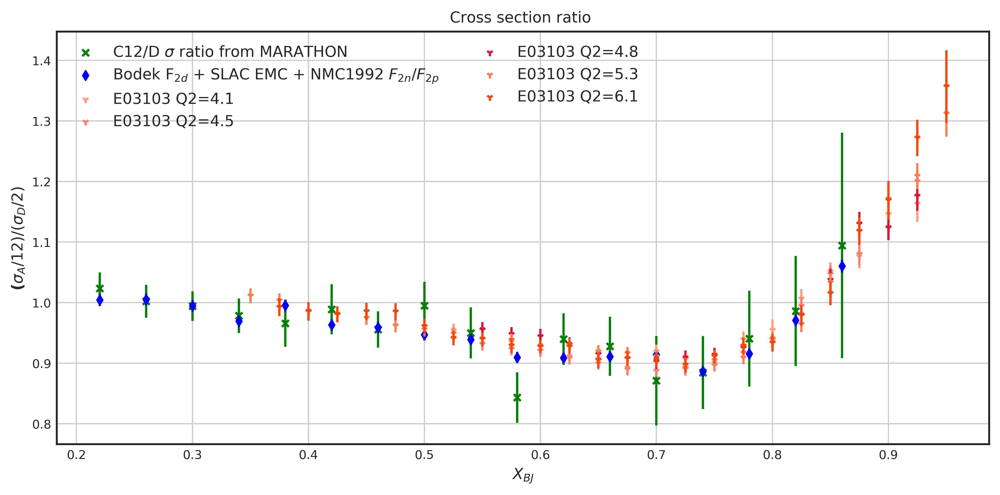

In [582]:
EMC_C12 =EMC_one(C12_full,"C12",12,D2_full,25,"12")

In [ ]:
H3_ratios={} 
cuttype="tightcut/"
bins=50
H3_ratios = all_tgt("H3",bins)
H3_full =together("H3",H3_ratios,bins)

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.048529 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.046334 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



[[7.06673451 0.         0.        ]
 [0.         5.78058089 2.21409671]
 [0.         1.44279382 4.98340948]]

0 H_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,47 m=2016 fp=0.014238 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,46 m=2016 fp=0.013843 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



[[5.62872011 0.         0.         0.        ]
 [0.         4.79472629 0.         0.        ]
 [0.         0.43909662 3.99296834 1.22577773]
 [0.         0.         2.25704369 3.46383959]]

1 H_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.005533 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.004983 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


[[3.87331875 0.         0.         0.        ]
 [0.         3.33430314 0.19792976 0.        ]
 [0.         1.5107221  2.80516375 1.65859177]
 [0.         0.         1.11511555 2.43733417]]

2 H_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001704 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



[[2.73067734 0.41428771 0.         0.        ]
 [0.         2.35889733 1.11496859 0.        ]
 [0.         0.05135229 1.99861289 1.60047675]
 [0.         0.         1.4229337  1.73511256]]

3 H_kin4
[<matplotlib.collections.PathCollection object at 0x7ff5e0d03048>, <matplotlib.collections.PathCollection object at 0x7ff5e0d265f8>] ['Monte Carlo', 'Data ']


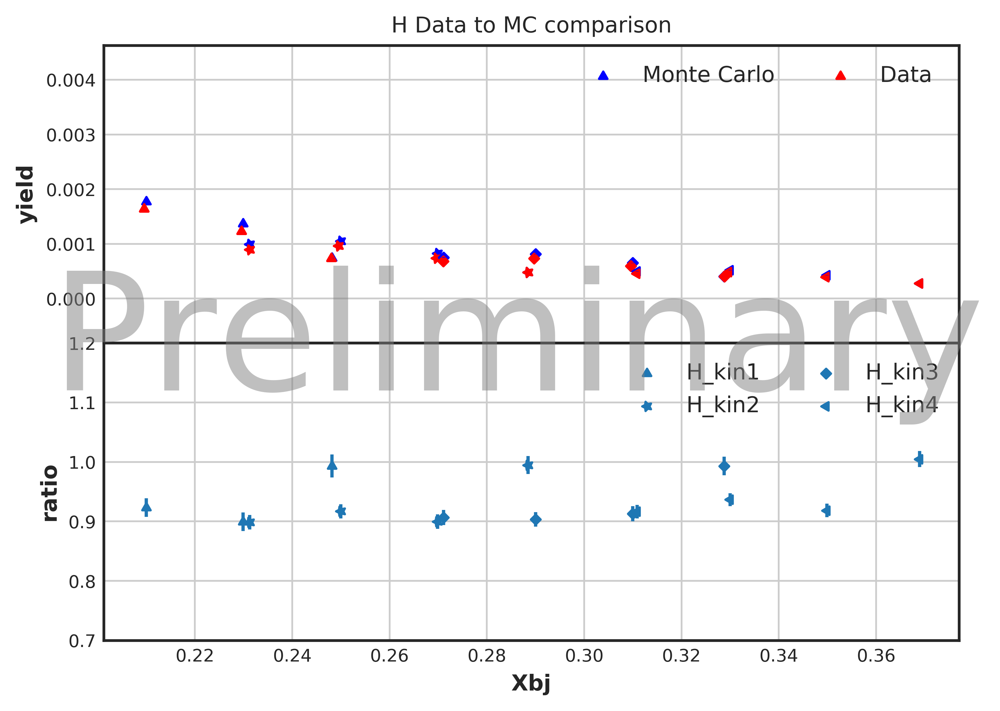

In [8]:
H_ratios25={} 
cuttype="tightcut/"
bins=25
max_kin=15
H_ratios25,kinsH,figH,Hdata,HMC = all_tgt("H",bins)
kincenteral(H_ratios25,kinsH)
H_full =together("H",H_ratios25,bins)
cs_dmc_r(H_full,"H")



start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=5.205819 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=5.284120 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 C12_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=1.507927 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=1.537332 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 C12_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.588362 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.466117 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



2 C12_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.167851 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.162644 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


3 C12_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.056802 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.009582 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 C12_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.008766 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 C12_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001366 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001317 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



6 C12_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000175 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000150 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 C12_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000024 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000032 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 C12_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.000012 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000010 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 C12_kin15
[<matplotlib.collections.PathCollection object at 0x7f0967383240>, <matplotlib.collections.PathCollection object at 0x7f0967b1ce80>] ['Monte Carlo', 'Data ']


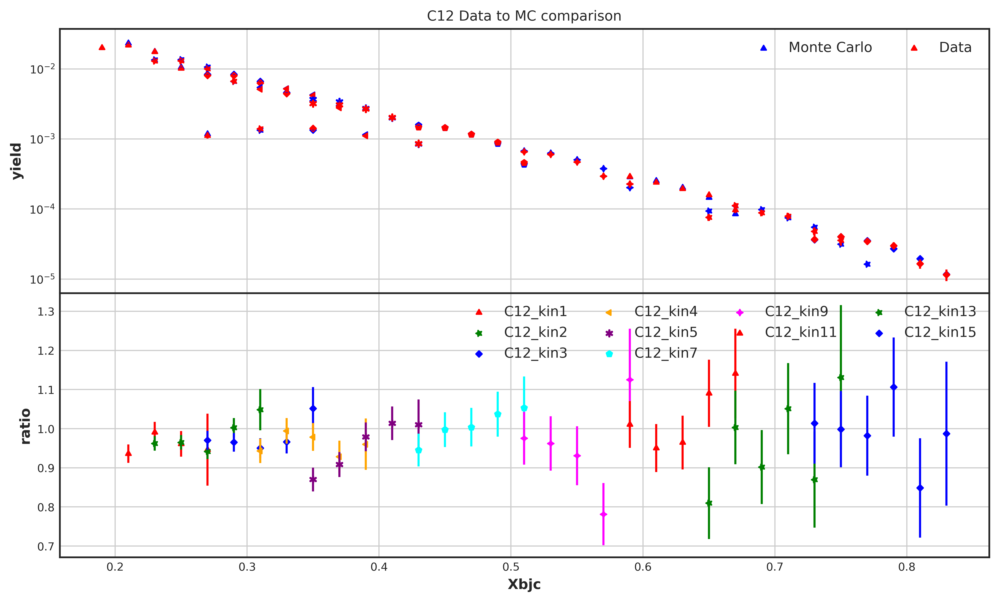

In [514]:
C12_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
C12_ratios,kinsC12,figC12,C12data,C12MC = all_tgt("C12",bins)

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=5.205819 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=5.284120 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 C12_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=1.507927 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=1.537332 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 C12_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.588362 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.466117 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


2 C12_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.162644 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 C12_kin4
5

4 C12_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.062421 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.056802 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


5 C12_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001366 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001317 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



6 C12_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000175 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000150 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


7 C12_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000032 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.000012 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 C12_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000010 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 C12_kin15
[<matplotlib.collections.PathCollection object at 0x7f09658e07b8>, <matplotlib.collections.PathCollection object at 0x7f0966765160>] ['Monte Carlo', 'Data ']


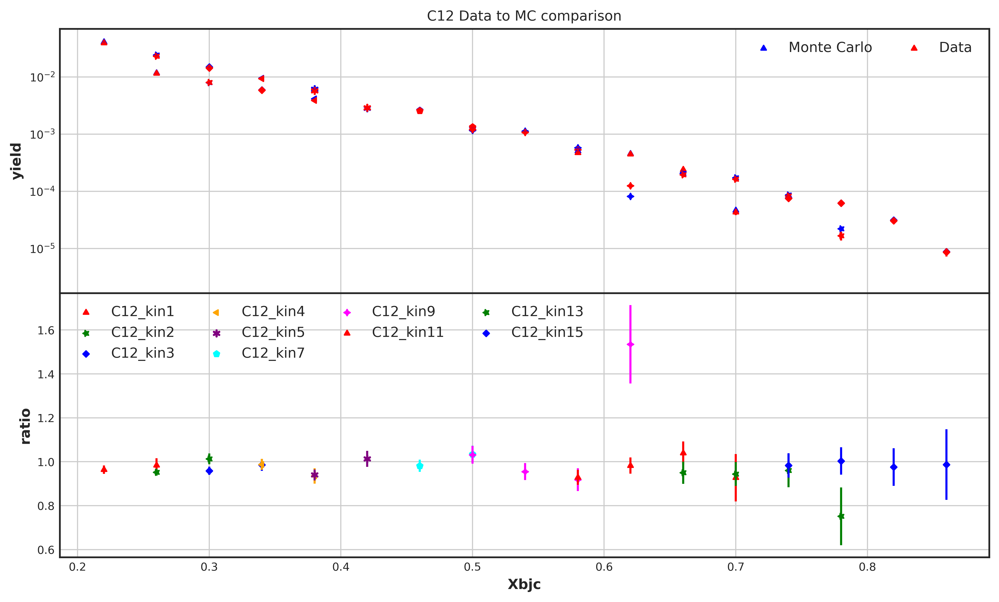

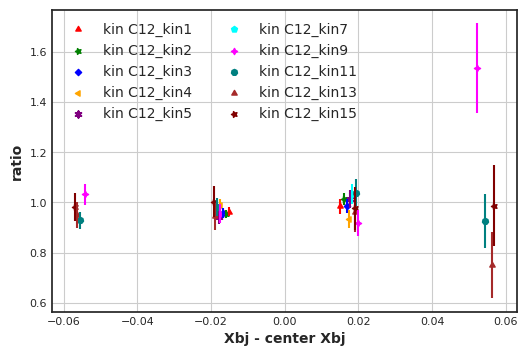

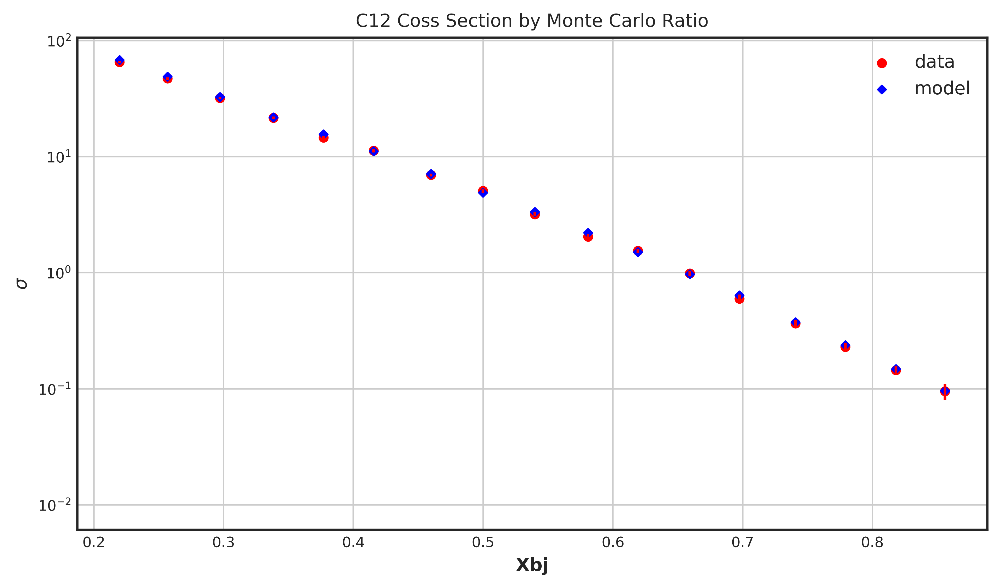

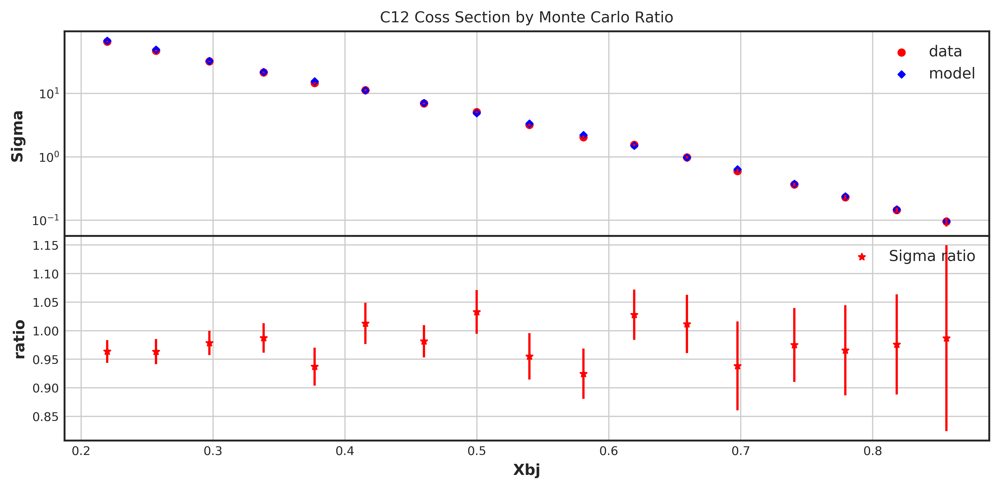

In [581]:
C12_ratios25={} 
cuttype="tightcut/"
bins=25
max_kin=15
C12_ratios25,kinsC12,figC12,C12data,C12MC = all_tgt("C12",bins)
kincenteral(C12_ratios25,kinsC12)
C12_full =together("C12",C12_ratios25,bins)
cs_dmc_r(C12_full,"C12")

In [546]:
H3mc[1]['Error']/H3mc[1]['yield']

6    0.005964
7    0.009306
dtype: float64

In [547]:
H3data[1]['Error']/H3data[1]['yield']

6    0.007478
7    0.009230
dtype: float64

In [553]:

i=9
np.sqrt( pow( (H3mc[i]['Error']/H3mc[i]['yield']),2) +  pow((H3data[i]['Error']/H3data[i]['yield']),2) )

18    0.013546
19    0.013682
20    0.019323
21    0.041251
dtype: float64

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=57,66 m=3465 fp=0.227541 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=58,65 m=3465 fp=0.228281 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 D2_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.043141 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.041695 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


1 D2_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.012942 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.004710 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



2 D2_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.004572 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 D2_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001818 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001455 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


4 D2_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000203 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 D2_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000046 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000034 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


6 D2_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000004 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 D2_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 D2_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 D2_kin15
[<matplotlib.collections.PathCollection object at 0x7f0962d49e48>, <matplotlib.collections.PathCollection object at 0x7f096697fba8>] ['Monte Carlo', 'Data ']


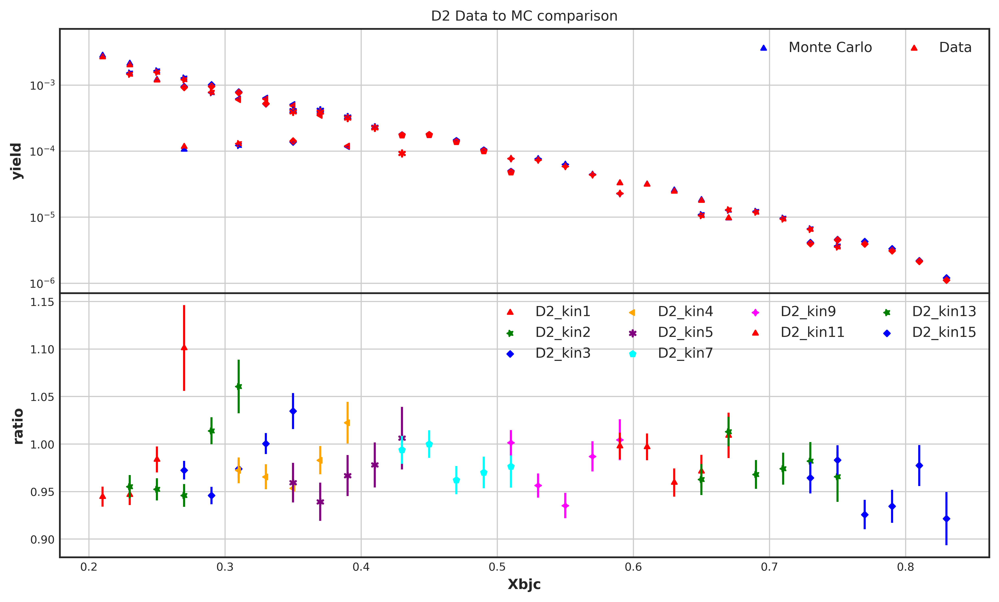

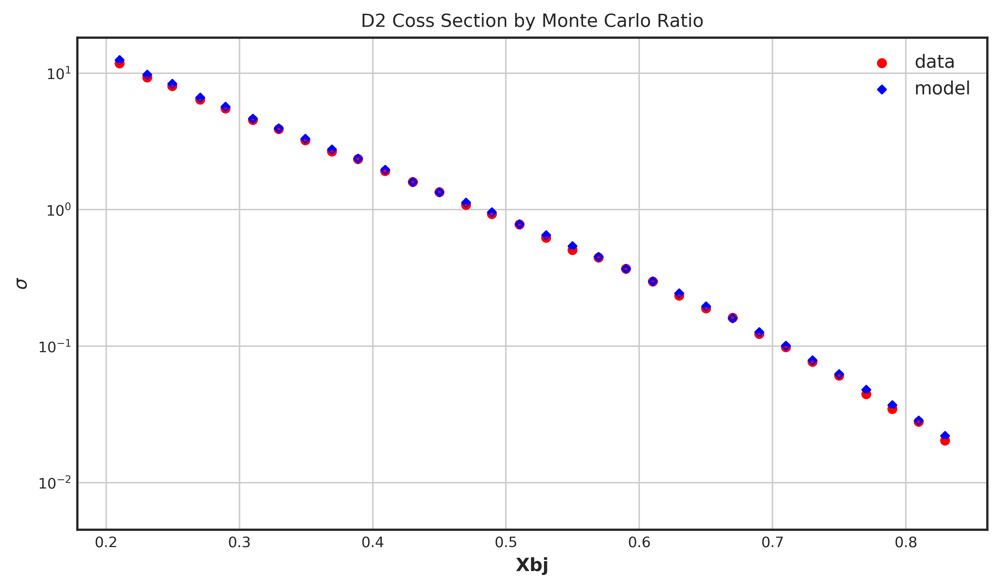

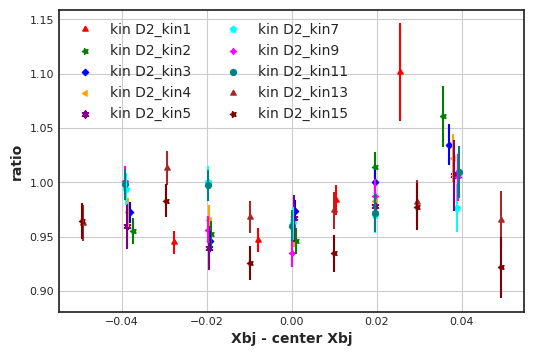

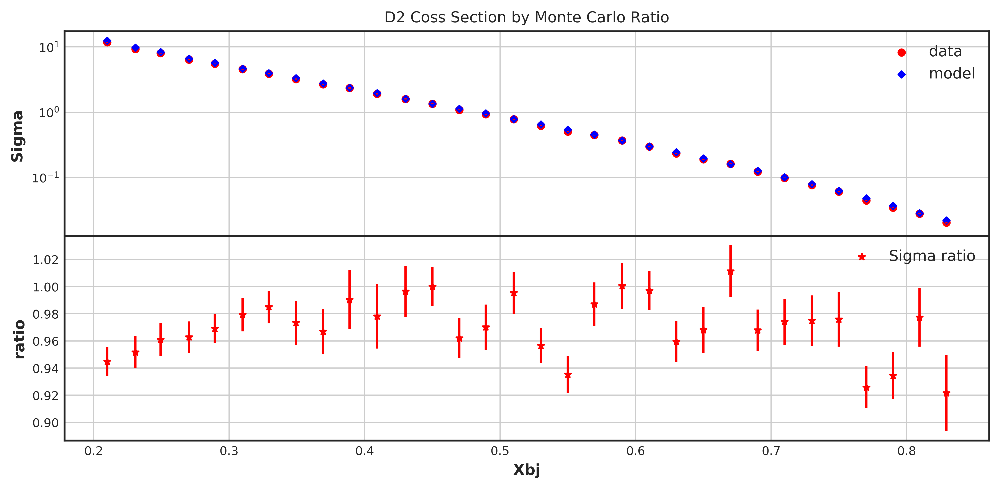

In [636]:
D2_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
D2_ratios,kinsD2,figD2,D2data,D2mc = all_tgt("D2",bins)
D2_full =together("D2",D2_ratios,bins)
kincenteral(D2_ratios,kinsD2)
cs_dmc_r(D2_full,"D2")

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=57,66 m=3465 fp=0.227541 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=58,65 m=3465 fp=0.228281 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 D2_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.043141 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.041695 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 D2_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.015774 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.012942 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


2 D2_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.004572 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001818 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 D2_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001455 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 D2_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000277 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000203 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 D2_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000046 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000034 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


6 D2_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000004 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 D2_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 D2_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 D2_kin15
[<matplotlib.collections.PathCollection object at 0x7f096635bc18>, <matplotlib.collections.PathCollection object at 0x7f0965d984e0>] ['Monte Carlo', 'Data ']


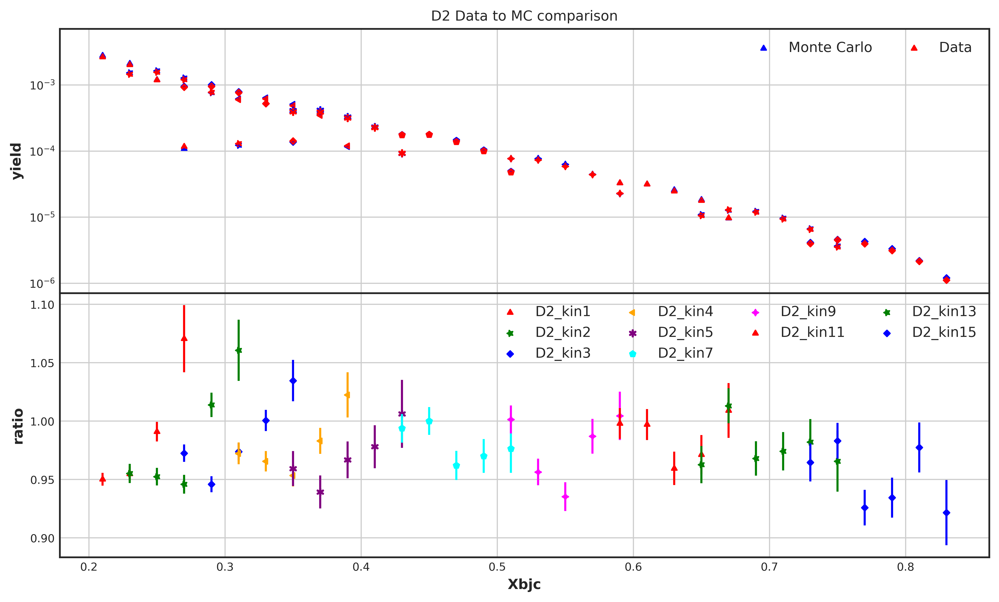

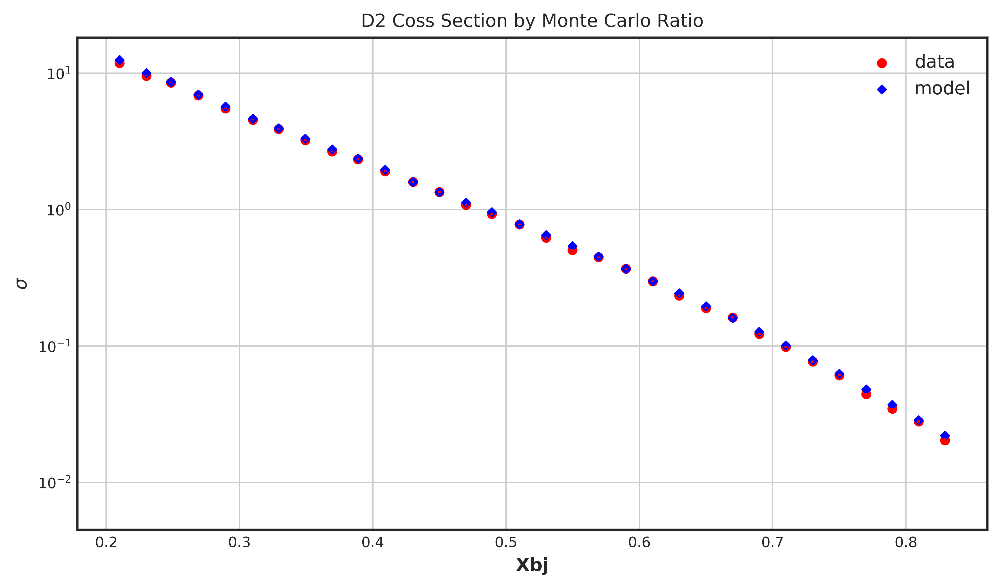

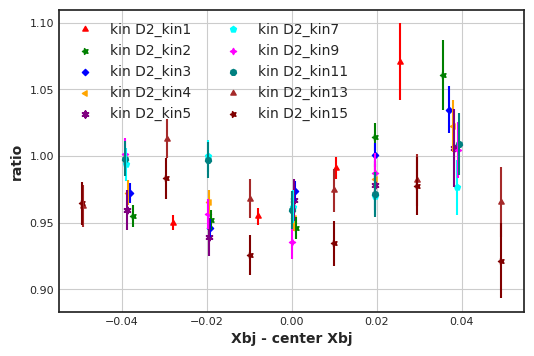

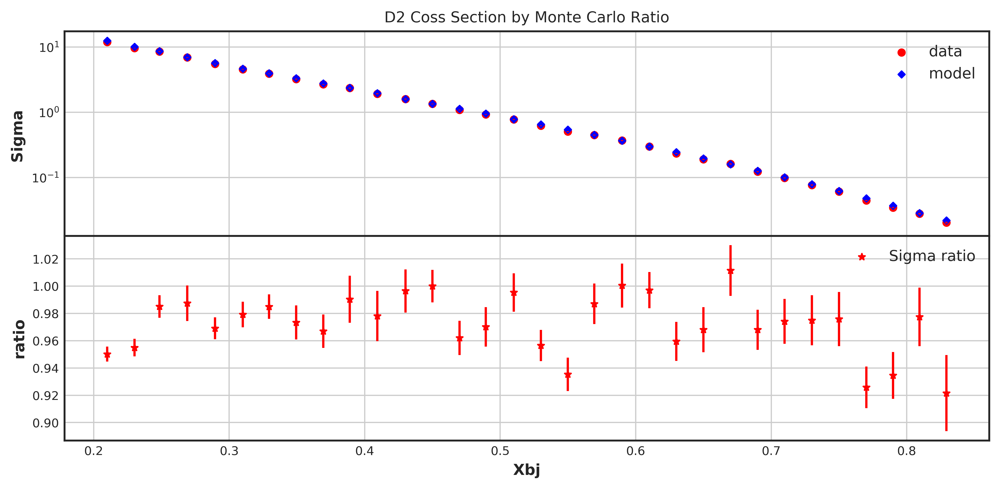

In [662]:
D2_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
D2_ratios,kinsD2,figD2,D2data,D2mc = all_tgt("D2",bins)
D2_full =together("D2",D2_ratios,bins)
kincenteral(D2_ratios,kinsD2)
cs_dmc_r(D2_full,"D2")

In [663]:
D2_ratios[0]

,Xbjc,Xbj,Q2,Ne,Yield,Error,yield,Data_Ne,Data_xbjc,data_err,...,offset,ratio_err,new_x,Sigma_Born,Sigma_Rad,RCF,Sigma_Born_C,Sigma_Rad_C,Sig_Born_err,Sig_Rad_err
10,0.21,0.209911,2.95145,234491,2.798320,5.778760e-06,0.002798,34469,0.21,0.000021,...,-0.000139,0.005481,-0.027922,12.489807,14.369842,0.869168,11.867396,13.653743,0.068458,0.082893
11,0.23,0.229940,3.23285,223756,2.119830,4.481400e-06,0.002120,26181,0.23,0.000017,...,-0.000096,0.006237,-0.007893,10.093081,11.409897,0.884590,9.637809,10.895226,0.062953,0.074527
12,0.25,0.248241,3.47822,152588,1.202380,3.078100e-06,0.001202,15383,0.25,0.000012,...,-0.000011,0.008383,0.010408,8.737197,9.686314,0.902015,8.658137,9.598666,0.073242,0.081940
13,0.27,0.263242,3.65824,15615,0.109674,8.776730e-07,0.000110,1514,0.27,0.000003,...,0.000008,0.028818,0.025409,8.379778,9.062557,0.924659,8.971468,9.702457,0.241488,0.243940


start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=55,68 m=3465 fp=0.575548 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,70 m=3465 fp=0.585852 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 He3_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.109307 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 He3_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.105030 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.039761 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


2 He3_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.012296 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.010368 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


3 He3_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.004051 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000739 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 He3_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=46,59 m=2500 fp=0.000514 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000121 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 He3_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000091 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.000015 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



6 He3_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.000013 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 He3_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000003 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000002 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 He3_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 He3_kin15
[<matplotlib.collections.PathCollection object at 0x7f0967eab710>, <matplotlib.collections.PathCollection object at 0x7f096696da90>] ['Monte Carlo', 'Data ']


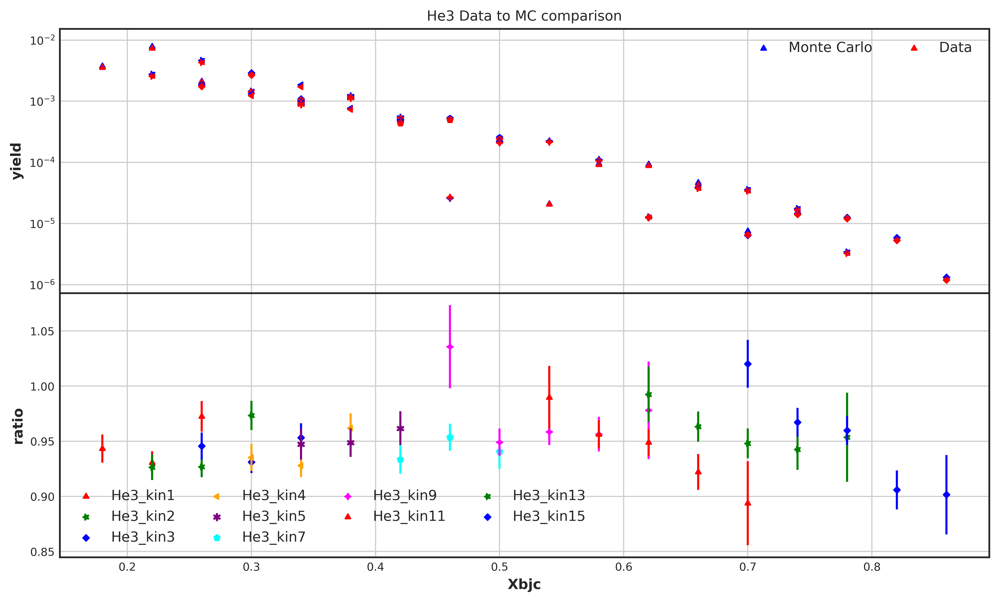

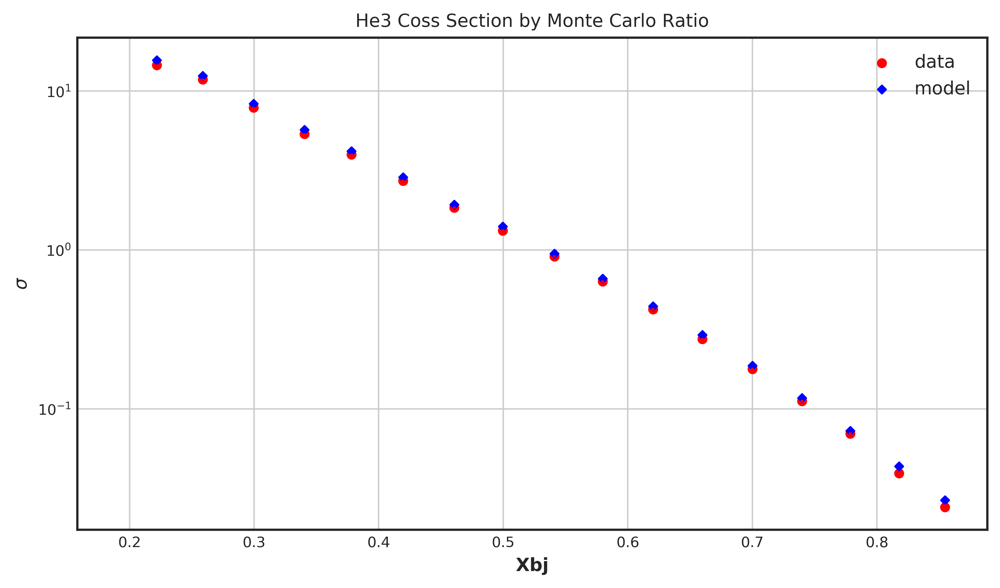

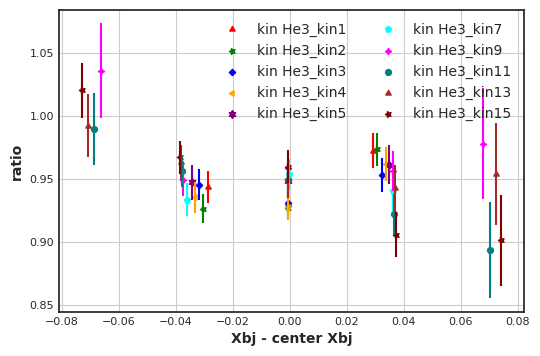

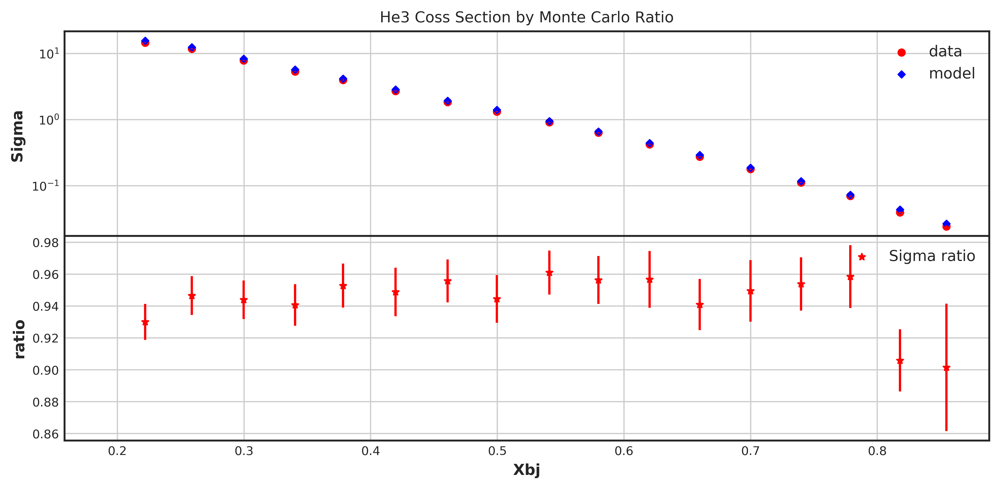

In [516]:
He3_ratios={} 
cuttype="tightcut/"
bins=25
max_kin=15
He3_ratios,kinsHe3,figHe3,He3data,He3mc = all_tgt("He3",bins)
He3_full =together("He3",He3_ratios,bins)
kincenteral(He3_ratios,kinsHe3)
cs_dmc_r(He3_full,"He3")

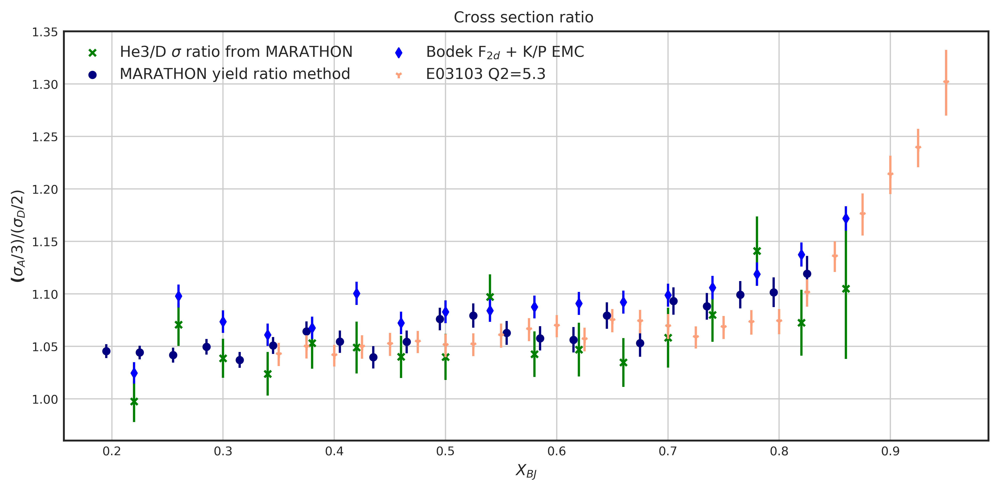

In [506]:
EMC_He3 =EMC_one(He3_full,"He3",3,D2_full,25,"123")

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.293125 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 H3_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.282402 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.085318 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


1 H3_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.029284 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.024448 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



2 H3_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.009279 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.008106 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 H3_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.003308 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=46,59 m=2500 fp=0.002525 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


4 H3_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000381 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 H3_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000079 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000063 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


6 H3_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000008 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 H3_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000002 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 H3_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 H3_kin15
[<matplotlib.collections.PathCollection object at 0x7f0965e65048>, <matplotlib.collections.PathCollection object at 0x7f0966506128>] ['Monte Carlo', 'Data ']


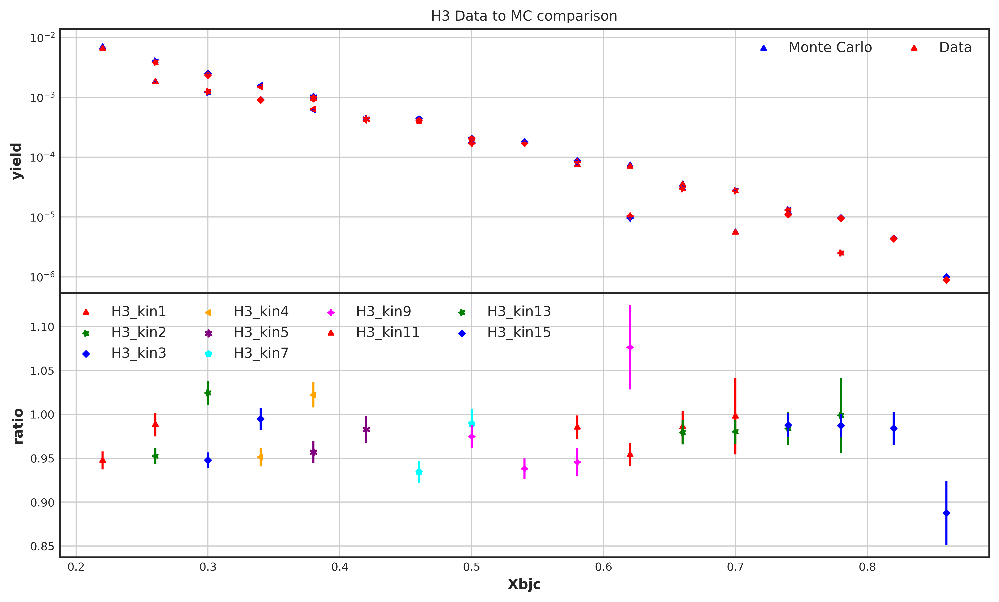

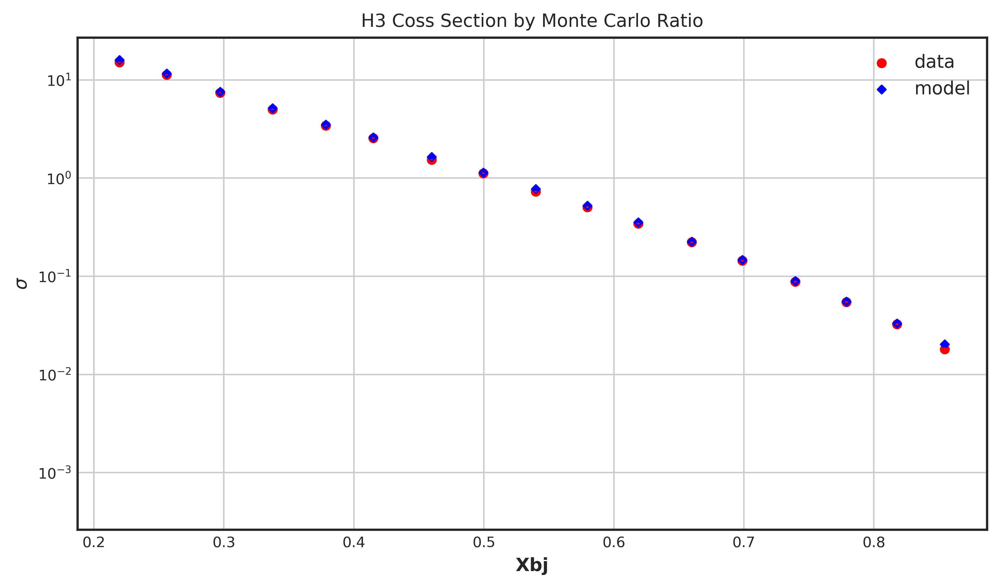

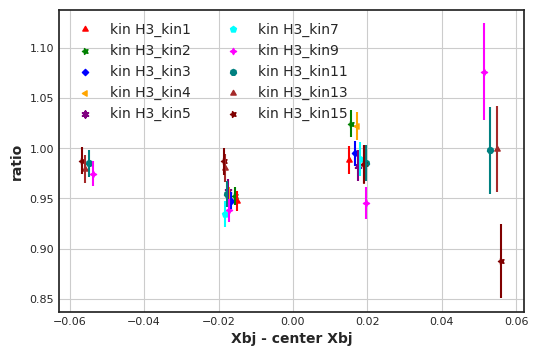

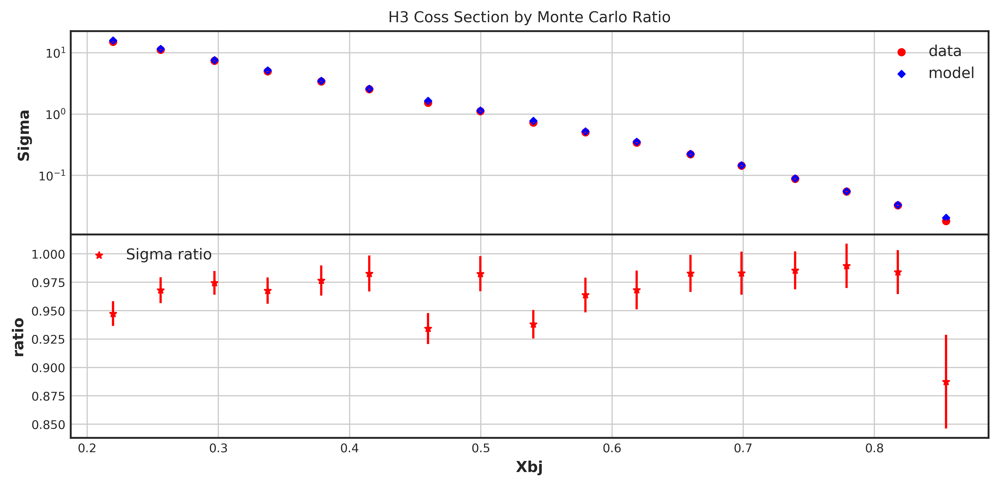

In [545]:
H3_ratios={} 
cuttype="tightcut/"
bins=25
max_kin=15
H3_ratios,kinsH3,figH3,H3data,H3mc = all_tgt("H3",bins)
H3_full =together("H3",H3_ratios,bins)
kincenteral(H3_ratios,kinsH3)
cs_dmc_r(H3_full,"H3")

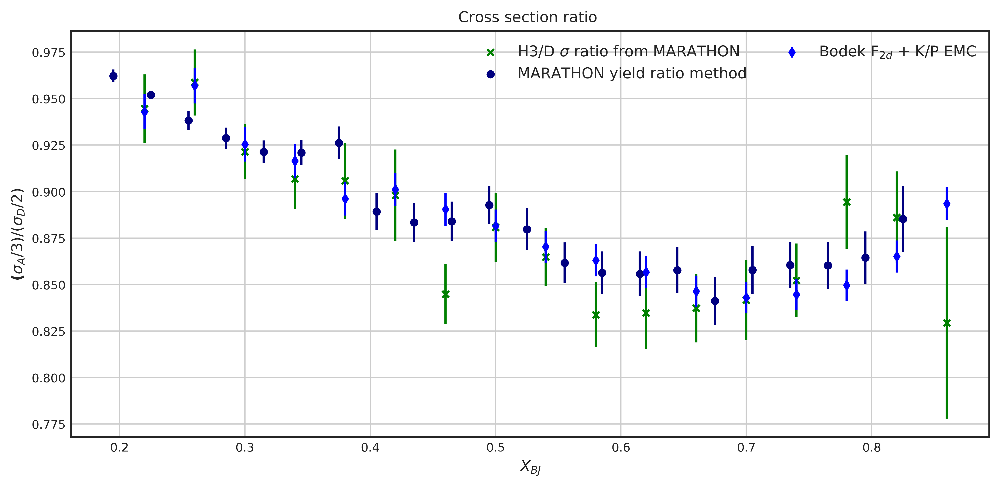

In [571]:
EMC_H3 =EMC_one(H3_full,"H3",3,D2_full,25,"13")

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.293125 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.282402 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


0 H3_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.077685 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.029284 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 H3_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.024448 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.009279 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



2 H3_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.008106 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.003308 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 H3_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=46,59 m=2500 fp=0.002525 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000478 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 H3_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000381 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000079 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 H3_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000063 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



6 H3_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000010 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000008 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 H3_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000002 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


8 H3_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 H3_kin15
[<matplotlib.collections.PathCollection object at 0x7f096613c908>, <matplotlib.collections.PathCollection object at 0x7f0967644358>] ['Monte Carlo', 'Data ']
start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=57,66 m=3465 fp=0.227541 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 D2_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=58,65 m=3465 fp=0.228281 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.043141 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 D2_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.041695 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.015774 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


2 D2_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.004710 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 D2_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.004572 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.001818 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


4 D2_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000277 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000203 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 D2_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000046 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



6 D2_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000034 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000006 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


7 D2_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 D2_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=52,53 m=2500 fp=0.000000 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 D2_kin15
[<matplotlib.collections.PathCollection object at 0x7f0964e4d048>, <matplotlib.collections.PathCollection object at 0x7f09629c1550>] ['Monte Carlo', 'Data ']


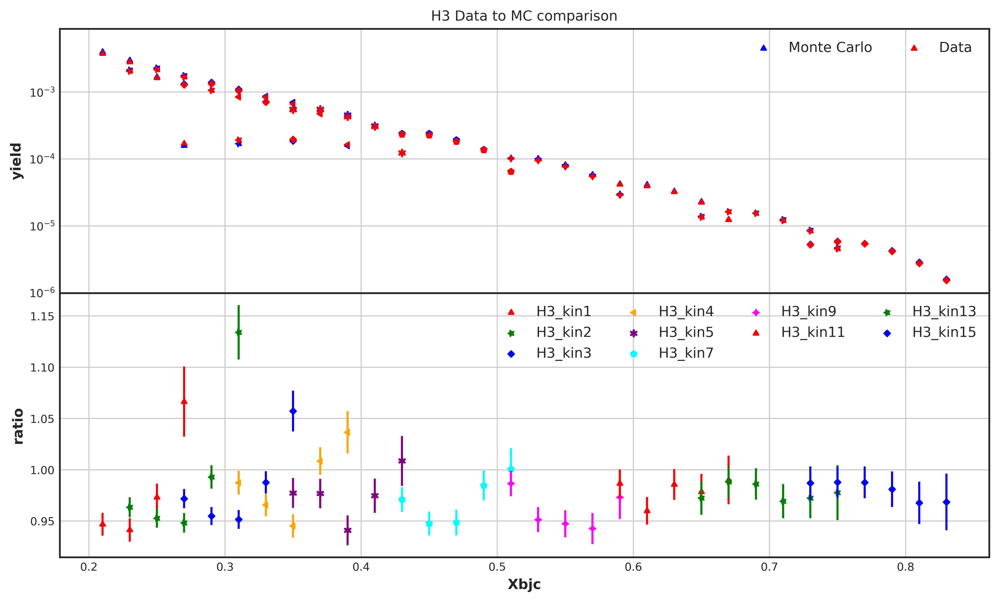

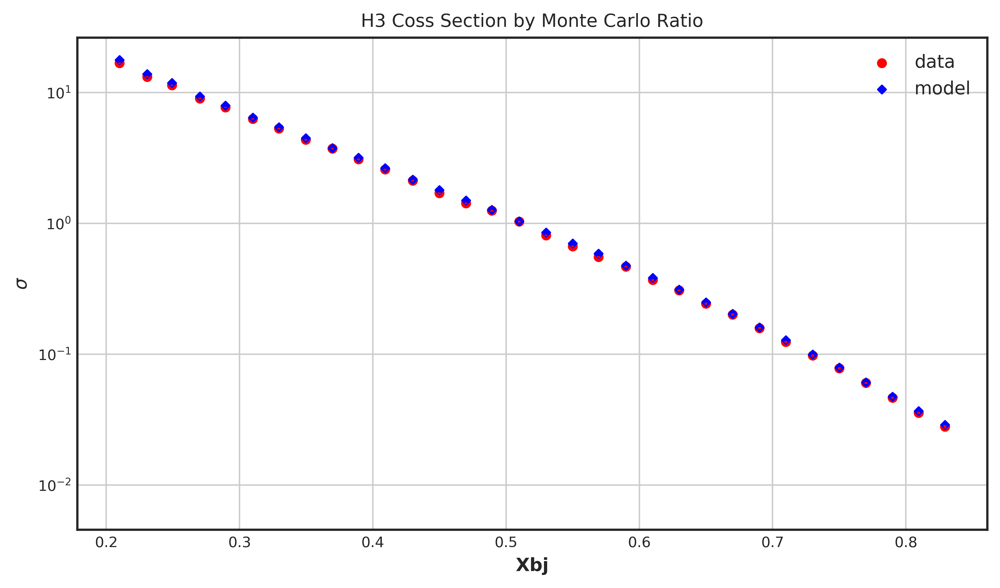

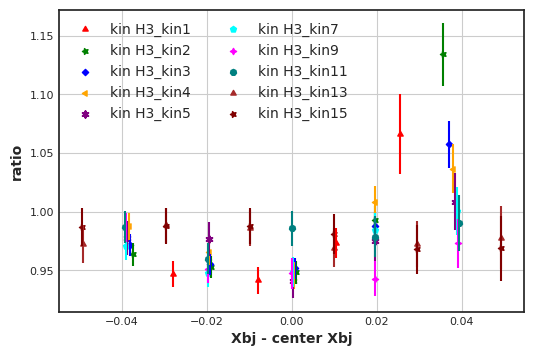

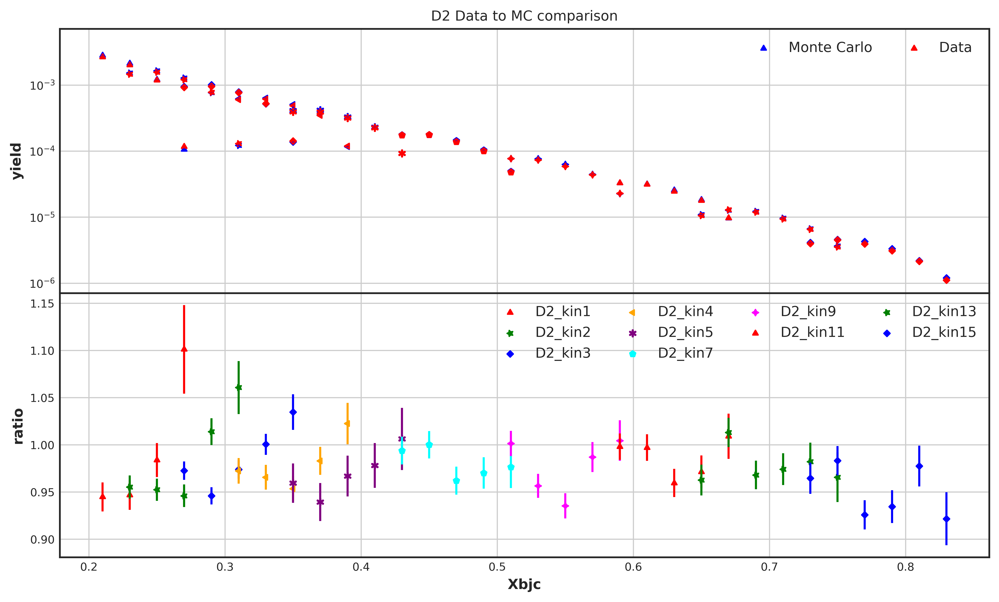

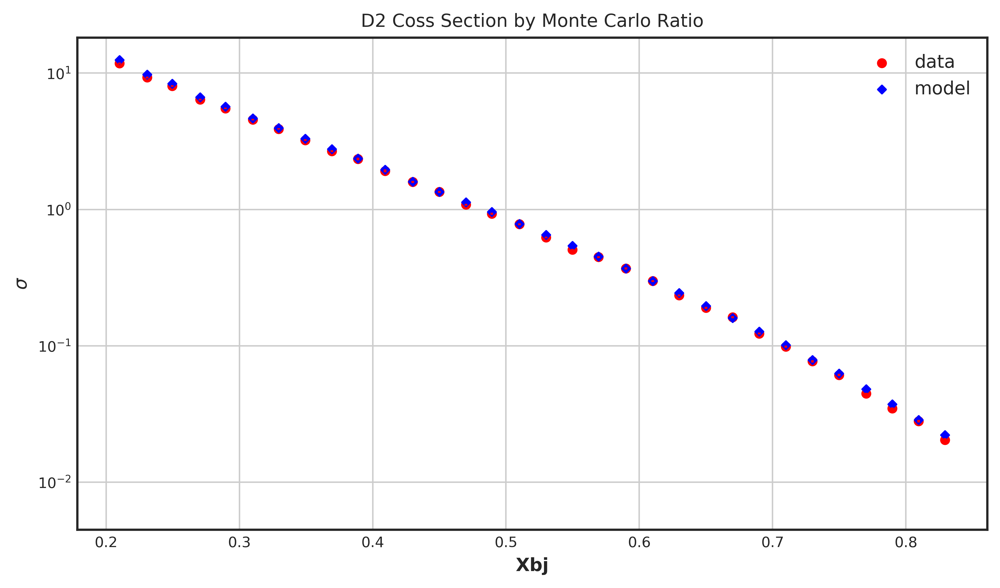

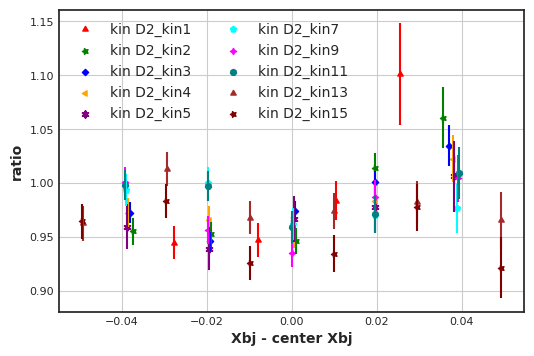

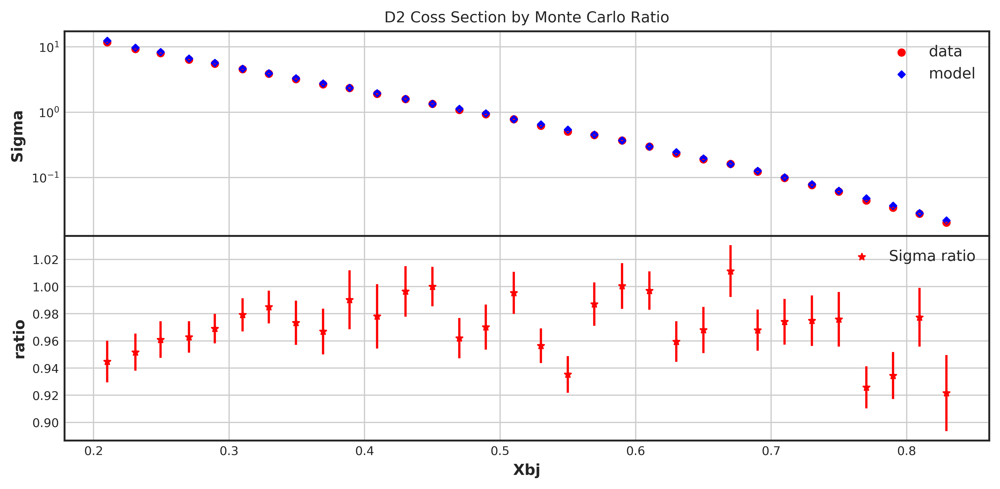

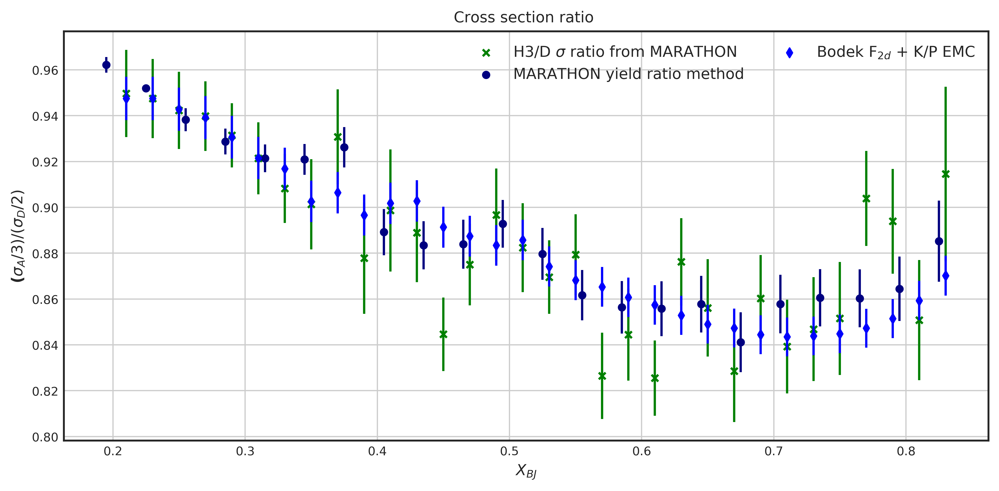

In [612]:
H3_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
H3_ratios,kinsH3,figH3,H3data,H3mc = all_tgt("H3",bins)
H3_full =together("H3",H3_ratios,bins)
kincenteral(H3_ratios,kinsH3)


D2_ratios={} 
D2_ratios,kinsD2,figD2,D2data,D2mc = all_tgt("D2",bins)
D2_full =together("D2",D2_ratios,bins)
kincenteral(D2_ratios,kinsD2)
cs_dmc_r(D2_full,"D2")



EMC_H3 =EMC_one(H3_full,"H3",3,D2_full,bins,"13")

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=55,68 m=3465 fp=0.575548 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,70 m=3465 fp=0.585852 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



0 He3_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.109307 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.105030 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 He3_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.039761 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.033630 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


2 He3_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.010368 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.004644 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 He3_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.004051 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000739 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 He3_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=46,59 m=2500 fp=0.000514 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 He3_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000121 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000091 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


6 He3_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.000013 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 He3_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000003 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000002 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 He3_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.000001 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 He3_kin15
[<matplotlib.collections.PathCollection object at 0x7f096636a898>, <matplotlib.collections.PathCollection object at 0x7f0974310cc0>] ['Monte Carlo', 'Data ']


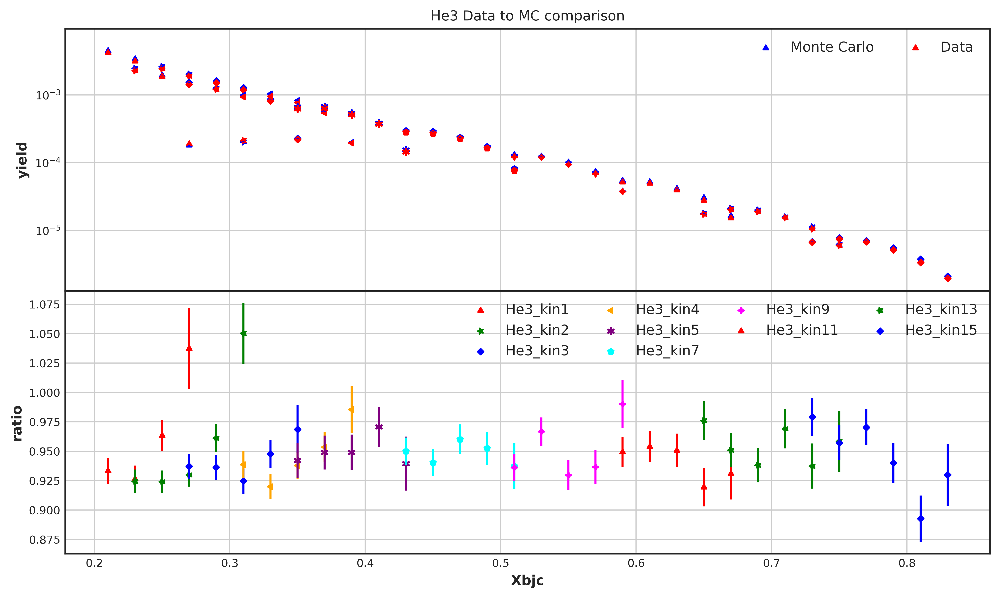

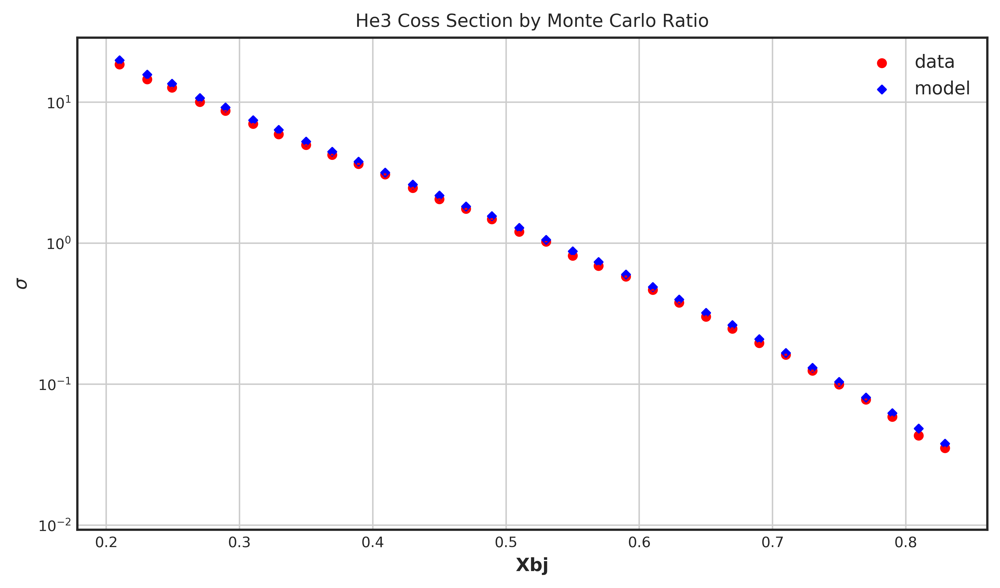

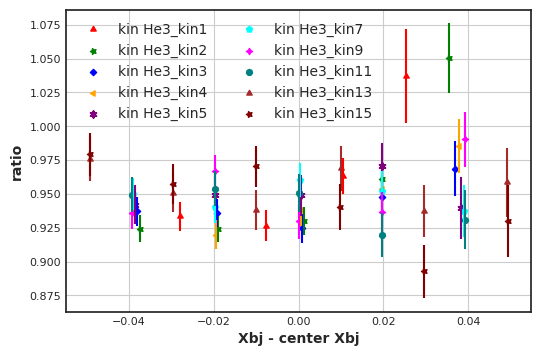

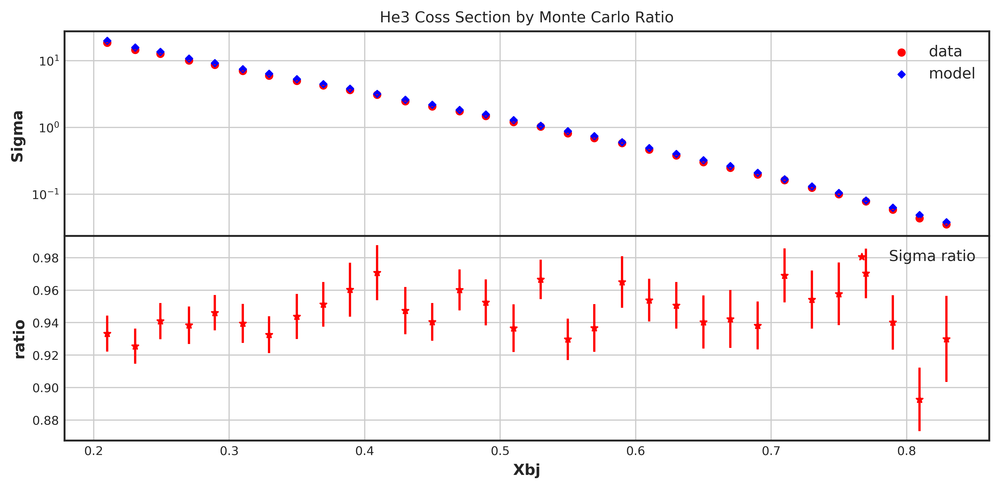

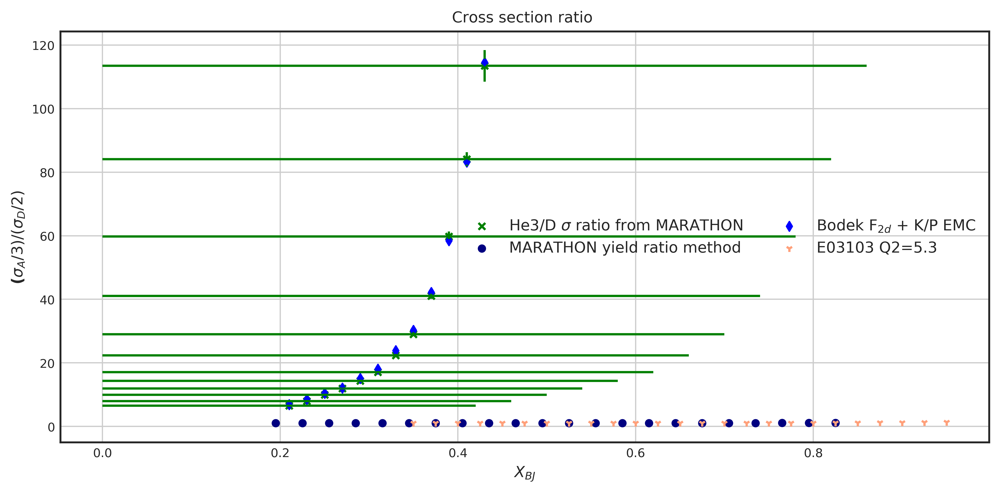

In [603]:
He3_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
He3_ratios,kinsHe3,figHe3,He3data,He3mc = all_tgt("He3",bins)
He3_full =together("He3",He3_ratios,bins)
kincenteral(He3_ratios,kinsHe3)
cs_dmc_r(He3_full,"He3")
EMC_He3 =EMC_one(He3_full,"He3",3,D2_full,bins,"123")

start second loop
1


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=5.205819 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=5.284120 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


0 C12_kin1
2


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=1.537332 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.588362 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



1 C12_kin2
3


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=47,58 m=2500 fp=0.466117 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.167851 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



2 C12_kin3
4


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.162644 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.062421 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



3 C12_kin4
5


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.056802 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.009582 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



4 C12_kin5
7


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.008766 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



5 C12_kin7
9


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001366 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.001317 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable c


6 C12_kin9
11


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.000150 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000024 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



7 C12_kin11
13


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=49,56 m=2500 fp=0.000032 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=53,52 m=2500 fp=0.000012 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



8 C12_kin13
15


/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=48,57 m=2500 fp=0.000010 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))



9 C12_kin15
[<matplotlib.collections.PathCollection object at 0x7f0962b88860>, <matplotlib.collections.PathCollection object at 0x7f0962ba3dd8>] ['Monte Carlo', 'Data ']


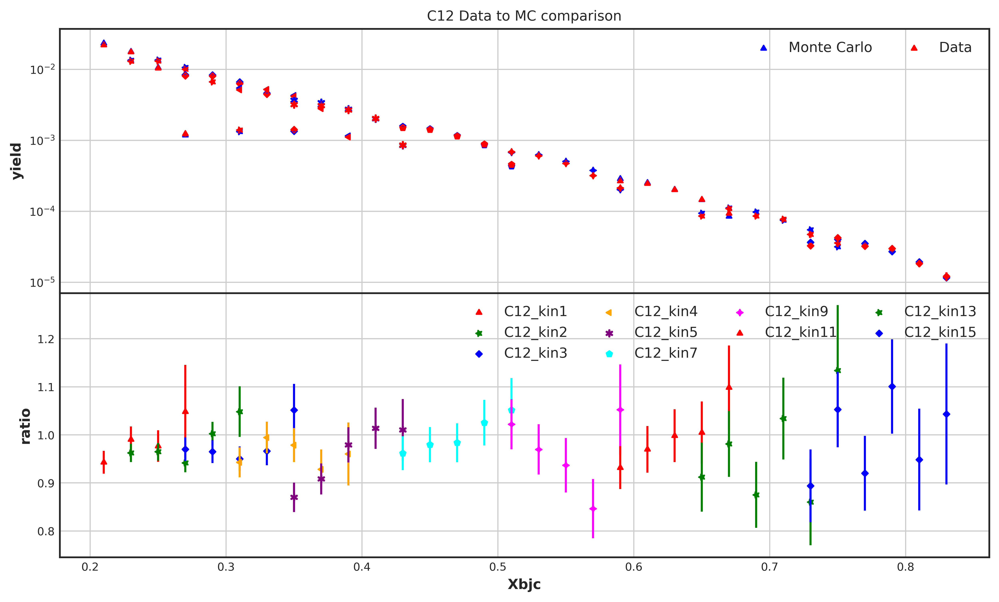

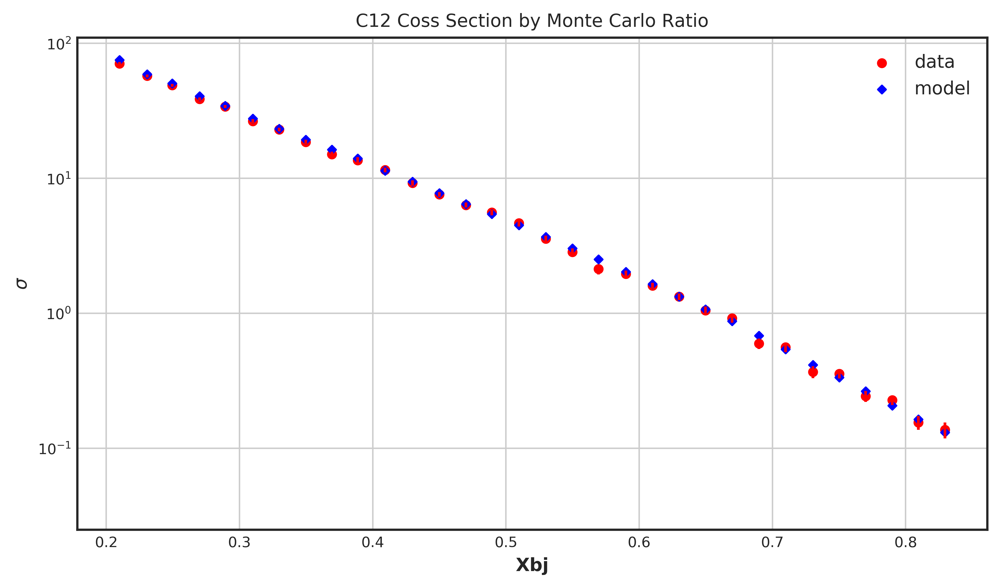

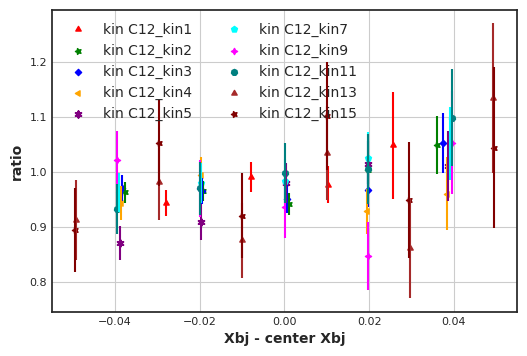

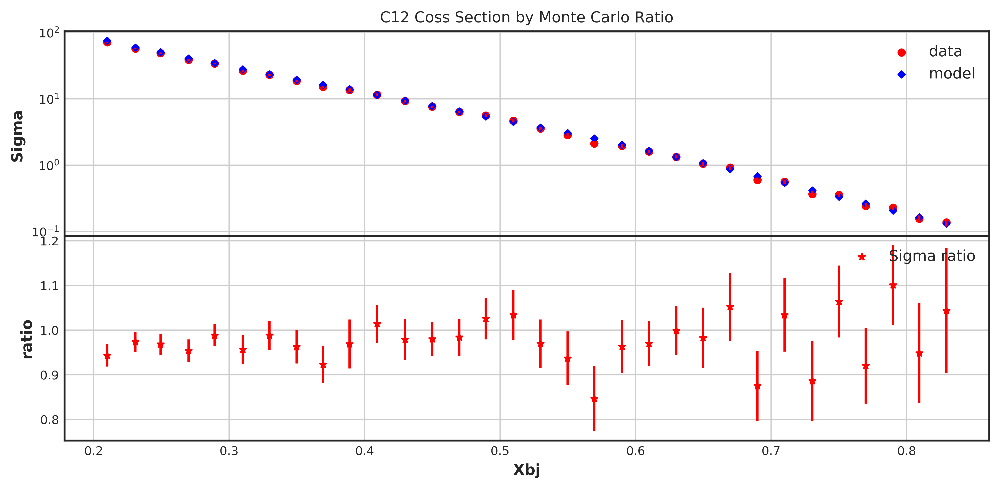

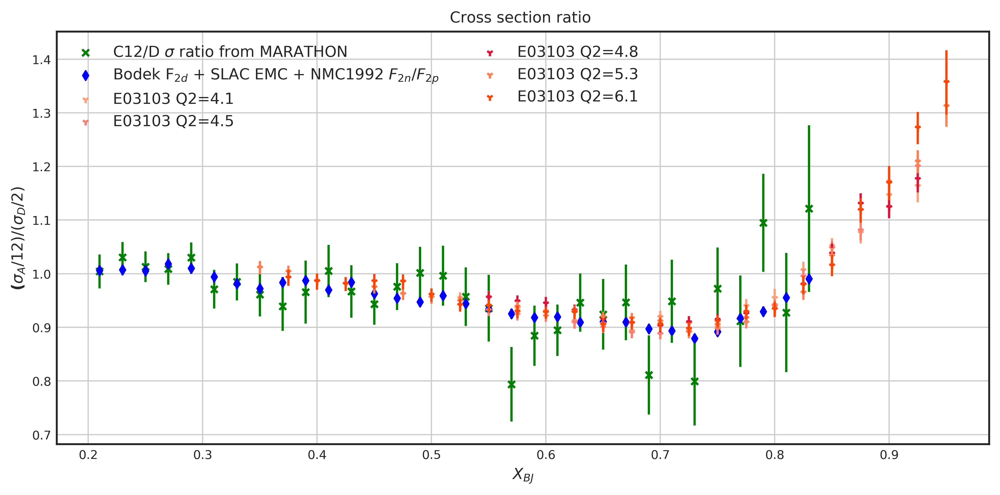

In [579]:
C12_ratios={} 
cuttype="tightcut/"
bins=50
max_kin=15
C12_ratios,kinsC12,figC12,C12data,C12mc = all_tgt("C12",bins)
C12_full =together("C12",C12_ratios,bins)
kincenteral(C12_ratios,kinsC12)
cs_dmc_r(C12_full,"C12")
EMC_C12 =EMC_one(C12_full,"C12",12,D2_full,bins,"12")

In [492]:
table={}
Cross_table("He3",table)

xbj=He3_ratios[0]["Xbjc"]
Q2=He3_ratios[0]["Q2"]
#   print( xbj,Q2)
sig_bb,sig_rr=interper(table[1],xbj,Q2)

/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=50,55 m=2500 fp=0.362411 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))
/home/jbane/anaconda3/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:974: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=51,54 m=2500 fp=0.379126 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))


In [493]:
He3_ratios[0][["Xbjc","Q2"]]

,Xbjc,Q2
4,0.18,2.70844
5,0.22,3.08988
6,0.26,3.49517


In [458]:
sig_bb

array([2.07344029])

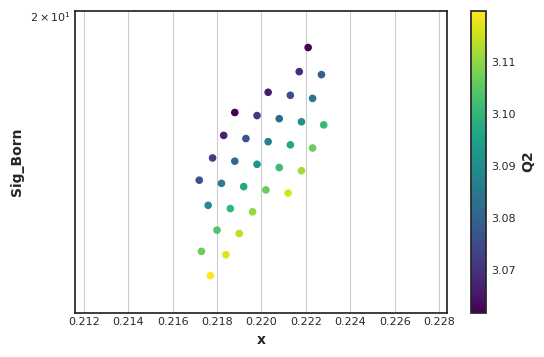

In [498]:
st=table[1][ (np.abs(table[1].x - 0.22) <= 0.003) & (np.abs(table[1].Q2-3.08988) <= 0.03) ].copy()
fig= plt.figure(dpi=100)
x=fig.add_subplot(1,1,1) 
st.plot(ax=x,x="x",y="Sig_Born",logy=True,kind="scatter",c="Q2",cmap="viridis")
x.grid(True)

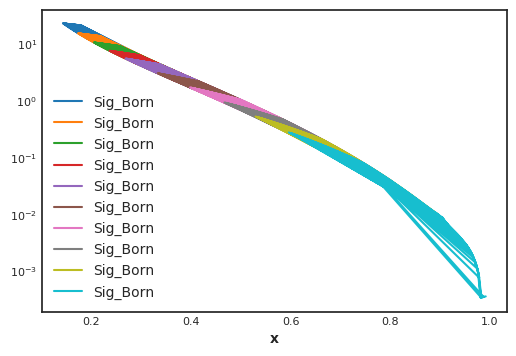

In [413]:
fig= plt.figure(dpi=100)
x=fig.add_subplot(1,1,1)   

for i in table.keys():
    if len(table[i]) > 1:
        table[i].plot(ax=x,x="x",y="Sig_Born",logy=True)

(table[1].x -0.18 >= -0.007) && (table[1].Q2 -2.7067 <= 0.05)

In [392]:
table.keys()

dict_keys([1, 2, 3, 4, 5, 7, 9, 11, 13, 15])

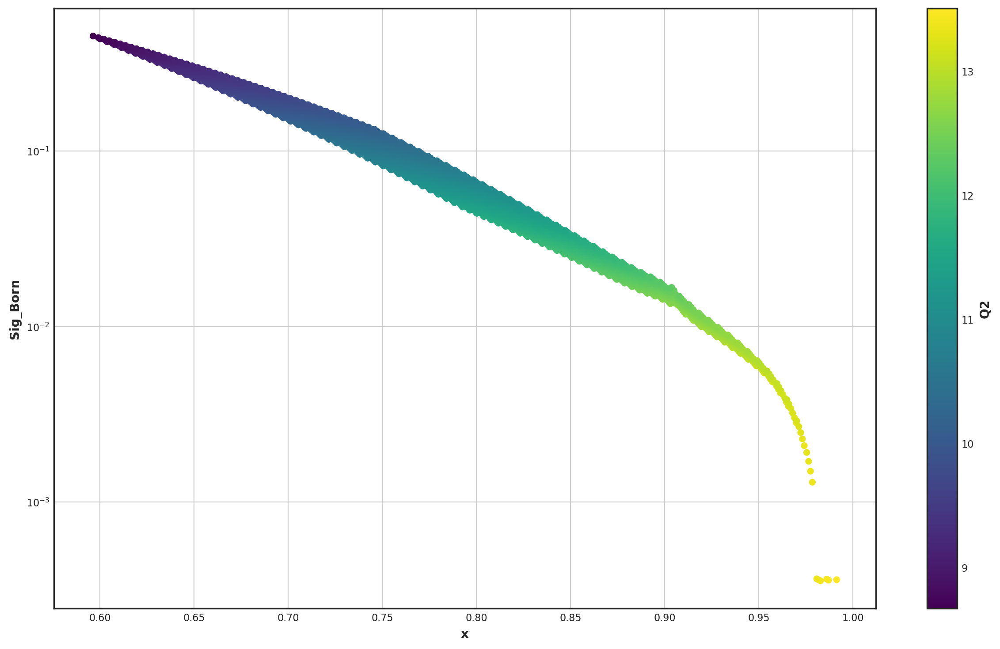

In [569]:
fig1= plt.figure(dpi=200,figsize=(15,9))
x1=fig1.add_subplot(1,1,1)
table[15].plot(ax=x1,x="x",y="Sig_Born",kind="scatter",logy=True,c="Q2",cmap="viridis")
x1.grid(True)

In [591]:
EMC_C12['D2_err_p'] = EMC_C12['D2_err']/EMC_C12['D2_Born']
EMC_C12['C12_err_p'] = EMC_C12['Sig_Born_err']/EMC_C12['Sigma_Born_C']
EMC_C12['EMC_err_p'] = EMC_C12['EMC_err']/EMC_C12['EMC']

EMC_C12[['Xbjc','D2_Born','D2_err','D2_err_p','Sigma_Born_C','Sig_Born_err','C12_err_p','EMC','EMC_err_p']]

,Xbjc,D2_Born,D2_err,D2_err_p,Sigma_Born_C,Sig_Born_err,C12_err_p,EMC,EMC_err_p
5,0.22,10.660512,0.166777,0.015644,65.456240,1.351155,0.020642,1.023344,0.025901
6,0.26,7.834093,0.112475,0.014357,47.099510,1.079029,0.022910,1.002020,0.027037
7,0.30,5.361131,0.063247,0.011797,31.981830,0.694107,0.021703,0.994250,0.024702
8,0.34,3.671922,0.047728,0.012998,21.552516,0.562995,0.026122,0.978258,0.029177
9,0.38,2.521427,0.045239,0.017942,14.605627,0.517907,0.035459,0.965434,0.039740
10,0.42,1.900077,0.042213,0.022216,11.273363,0.399650,0.035451,0.988851,0.041837
11,0.46,1.213969,0.015244,0.012557,6.959739,0.200748,0.028844,0.955507,0.031459
12,0.50,0.849145,0.011923,0.014041,5.068045,0.188081,0.037111,0.994735,0.039678
13,0.54,0.560778,0.006844,0.012205,3.195756,0.135833,0.042504,0.949799,0.044222
14,0.58,0.404365,0.005514,0.013636,2.045639,0.097357,0.047593,0.843148,0.049508


In [652]:
EMC_He3['D2_err_p'] = EMC_He3['D2_err']/EMC_He3['D2_Born']
EMC_He3['He3_err_p'] = EMC_He3['Sig_Born_err']/EMC_He3['Sigma_Born_C']
EMC_He3['EMC_err_p'] = EMC_He3['EMC_err']/EMC_He3['EMC']

EMC_He3[['Xbjc','D2_Born','D2_err','D2_err_p','Sigma_Born_C','Sig_Born_err','He3_err_p','EMC','EMC_err_p']]

,Xbjc,D2_Born,D2_err,D2_err_p,Sigma_Born_C,Sig_Born_err,He3_err_p,EMC,EMC_err_p
10,0.21,1.900077,0.042213,0.022216,18.592399,0.220480,0.011859,6.523384,0.025183
11,0.23,1.213969,0.015244,0.012557,14.546914,0.170137,0.011696,7.988624,0.017160
12,0.25,0.849145,0.011923,0.014041,12.730806,0.151416,0.011894,9.994995,0.018401
13,0.27,0.560778,0.006844,0.012205,10.081143,0.124301,0.012330,11.984712,0.017349
14,0.29,0.404365,0.005514,0.013636,8.688471,0.100159,0.011528,14.324461,0.017856
15,0.31,0.274124,0.004137,0.015092,7.021297,0.090117,0.012835,17.075725,0.019812
16,0.33,0.176917,0.002588,0.014627,5.941679,0.072700,0.012236,22.389650,0.019070
17,0.35,0.114405,0.001950,0.017044,4.978915,0.073235,0.014709,29.013298,0.022513
18,0.37,0.068937,0.001102,0.015982,4.248407,0.061235,0.014414,41.084642,0.021522
19,0.39,0.040720,0.000808,0.019849,3.648235,0.063199,0.017323,59.729278,0.026346


In [609]:
He3_full.keys()

Index(['Xbjc', 'Xbj', 'Q2', 'Ne', 'Yield', 'Error', 'yield', 'Data_Ne',
       'Data_xbjc', 'data_err', 'data_err_stat', 'data_Y', 'MC_Y', 'ratio',
       'offset', 'ratio_err', 'new_x', 'Sigma_Born', 'Sigma_Rad', 'RCF',
       'Sigma_Born_C', 'Sigma_Rad_C', 'Sig_Born_err', 'Sig_Rad_err',
       'Sigma_err_p', 'ratio_err_p'],
      dtype='object')

In [630]:
He3_full['Sigma_err_p'] = He3_full['Sig_Born_err']/He3_full['Sigma_Born_C']
He3_full['ratio_err_p'] = He3_full['ratio_err']/He3_full['ratio']
He3_full['data_err_p'] = He3_full['data_err']/He3_full['data_Y']
He3_full['MC_err_p'] = He3_full['Error']/He3_full['yield']
He3_full['data_err_stat_p']=He3_full['data_err_stat']/He3_full['data_Y']
He3_full['data_err_sys_p']=np.sqrt(He3_full['data_err_p']**2 - He3_full['data_err_stat_p']**2)




He3_full[['Xbjc', 'Sigma_Born_C','Sigma_Born','ratio','ratio_err','ratio_err_p','data_err_p','data_err_stat_p','data_err_sys_p','MC_err_p']]

,Xbjc,Sigma_Born_C,Sigma_Born,ratio,ratio_err,ratio_err_p,data_err_p,data_err_stat_p,data_err_sys_p,MC_err_p
10,0.21,18.592399,19.921653,0.933276,0.011067,0.011859,0.010722,0.005415,0.009254,0.005067
11,0.23,14.546914,15.717604,0.925492,0.010807,0.011677,0.010416,0.006000,0.008515,0.005458
12,0.25,12.730806,13.529970,0.940369,0.011138,0.011844,0.010137,0.006353,0.007899,0.005619
13,0.27,10.081143,10.743093,0.937417,0.011335,0.012091,0.009715,0.006390,0.007318,0.005549
14,0.29,8.688471,9.183343,0.945837,0.010891,0.011515,0.010060,0.006814,0.007400,0.005440
15,0.31,7.021297,7.473198,0.938243,0.011889,0.012672,0.010598,0.007422,0.007565,0.005442
16,0.33,5.941679,6.371366,0.932324,0.011399,0.012226,0.010924,0.007869,0.007577,0.005375
17,0.35,4.978915,5.275458,0.943342,0.013776,0.014603,0.012458,0.008987,0.008628,0.005840
18,0.37,4.248407,4.466169,0.951212,0.013720,0.014424,0.013269,0.009582,0.009178,0.005813
19,0.39,3.648235,3.798946,0.959578,0.016542,0.017239,0.015293,0.011391,0.010204,0.006361


In [664]:
D2_full['Sigma_err_p'] = D2_full['Sig_Born_err']/D2_full['Sigma_Born_C']
D2_full['ratio_err_p'] = D2_full['ratio_err']/D2_full['ratio']
D2_full['data_err_p'] = D2_full['data_err']/D2_full['data_Y']
D2_full['MC_err_p'] = D2_full['Error']/D2_full['yield']
D2_full['data_err_stat_p']=D2_full['data_err_stat']/D2_full['data_Y']
D2_full['data_err_sys_p']=np.sqrt(D2_full['data_err_p']**2 - D2_full['data_err_stat_p']**2)


D2_full[['Xbjc', 'Sigma_Born_C','Sigma_Born','ratio','ratio_err','ratio_err_p','data_err_p','data_err_stat_p','data_err_sys_p','MC_err_p']]

,Xbjc,Sigma_Born_C,Sigma_Born,ratio,ratio_err,ratio_err_p,data_err_p,data_err_stat_p,data_err_sys_p,MC_err_p
10,0.21,11.867396,12.489807,0.950167,0.005481,0.005769,0.007794,0.005386,0.005634,0.002065
11,0.23,9.589427,10.042117,0.954922,0.006418,0.006721,0.008535,0.006129,0.005939,0.002422
12,0.25,8.528327,8.657172,0.984817,0.008243,0.008370,0.010034,0.007500,0.006665,0.003244
13,0.27,6.891631,6.978984,0.983109,0.012105,0.012313,0.010279,0.006209,0.008192,0.005875
14,0.29,5.513818,5.689931,0.968340,0.008004,0.008266,0.009315,0.005836,0.007260,0.005563
15,0.31,4.553400,4.649901,0.978327,0.009196,0.009400,0.009752,0.006182,0.007542,0.005769
16,0.33,3.895343,3.954821,0.984666,0.008960,0.009099,0.010733,0.006808,0.008298,0.006035
17,0.35,3.223655,3.311816,0.971664,0.012366,0.012727,0.014229,0.008910,0.011095,0.007522
18,0.37,2.675338,2.766866,0.966630,0.012240,0.012663,0.015759,0.010075,0.012118,0.007932
19,0.39,2.346134,2.369048,0.989047,0.017155,0.017345,0.019763,0.013635,0.014307,0.009778


In [649]:
np.sqrt(0.005**2+0.003**2)

0.0058309518948453

In [ ]:
newfig = plt.figure(dpi=500,figsize=(11,5))
axis = newfig.add_subplot(1,1,1)
H3_full.plot(ax=axis,y="Sigma_Born_C",x='Xbj',yerr='Sig_Born_err',c='r',marker='d',kind="scatter",label="H3 cross section" )
He3_full.plot(ax=axis,y="Sigma_Born_C",x='Xbj',yerr='Sig_Born_err',c='b',marker='h',kind="scatter",label="He3 cross section" )
D2_full.plot(ax=axis,y="Sigma_Born_C",x='Xbj',yerr='Sig_Born_err',c='g',marker='x',kind="scatter",label="D2 cross section" )
axis.grid(True)
axis.set_yscale("log")
axis.set_ylabel("Cross section")

newfig.text(0.5, 0.5, 'Preliminary',
         fontsize=75, color='gray',
         ha='center', va='center', alpha=0.5)

newfig.savefig('images/{}{}bins/multisigma.png'.format(cuttype,bins),bbox_inches='tight')
newfig.savefig('images/{}{}bins/multisigma.pdf'.format(cuttype,bins),bbox_inches='tight')
newfig.savefig('images/{}{}bins/multisigma.eps'.format(cuttype,bins),bbox_inches='tight')
newfig.savefig('/home/jbane/latex_shows/images/multisigma.pdf'.format(cuttype,bins),bbox_inches='tight')


In [650]:
1/np.sqrt( 75000) 

0.0036514837167011074

In [628]:
1126+3242+4434+4920+4528+3430+2228+1300+597+186+4

25995

In [646]:
1/0.001**2

1000000.0

In [654]:
D2_ratios[0]

,Xbjc,Xbj,Q2,Ne,Yield,Error,yield,Data_Ne,Data_xbjc,data_err,...,offset,ratio_err,new_x,Sigma_Born,Sigma_Rad,RCF,Sigma_Born_C,Sigma_Rad_C,Sig_Born_err,Sig_Rad_err
5,0.22,0.219725,3.08951,30785,4.95222,0.000028,0.004952,60650,0.22,0.000064,...,-0.000269,0.006618,-0.014928,11.273179,12.850560,0.877252,10.660512,12.152166,0.074602,0.089928
6,0.26,0.249580,3.49365,11246,1.31777,0.000012,0.001318,16897,0.26,0.000020,...,-0.000009,0.012088,0.014928,9.682259,10.509132,0.921319,9.617234,10.438554,0.117039,0.127893
